/var/folders/_9/wb6xnpp934vc9w0g88_c9nhh0000gn/T/ipykernel_90066/3397657235.py:37: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby('eval_type', group_keys=False).apply(fix_global_rank)


CSV updated with corrected global 'rank_of_median_auc'.

Saved: replicate_results/Heatmap_MedianRank_Stratified.png


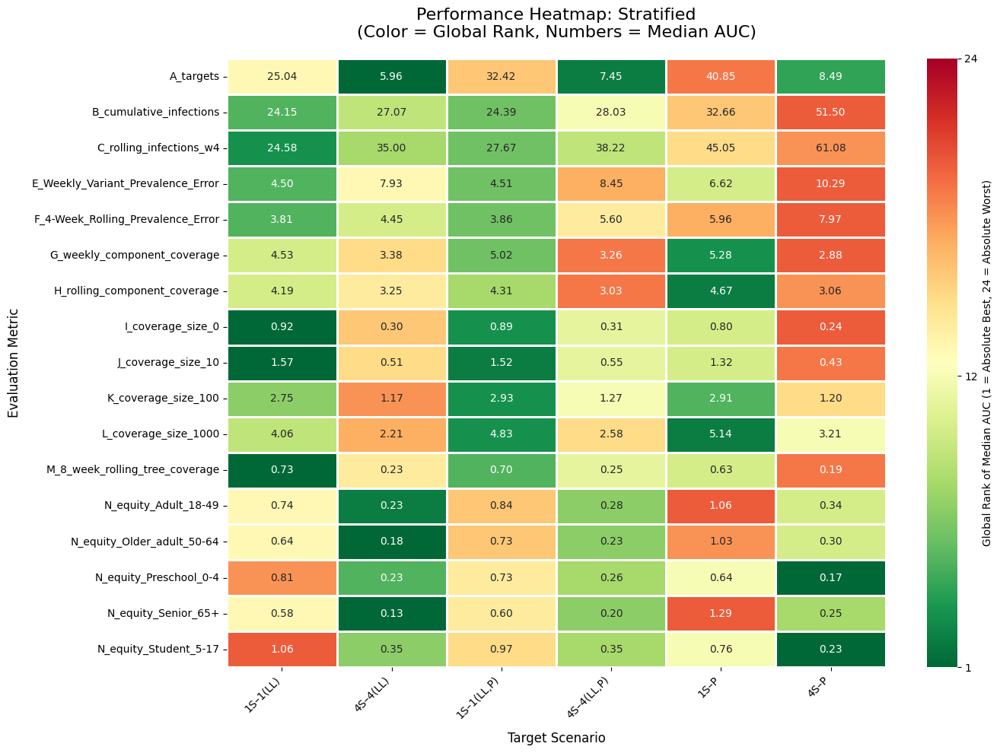

Saved: replicate_results/Heatmap_MedianRank_LASSO-Greedy.png


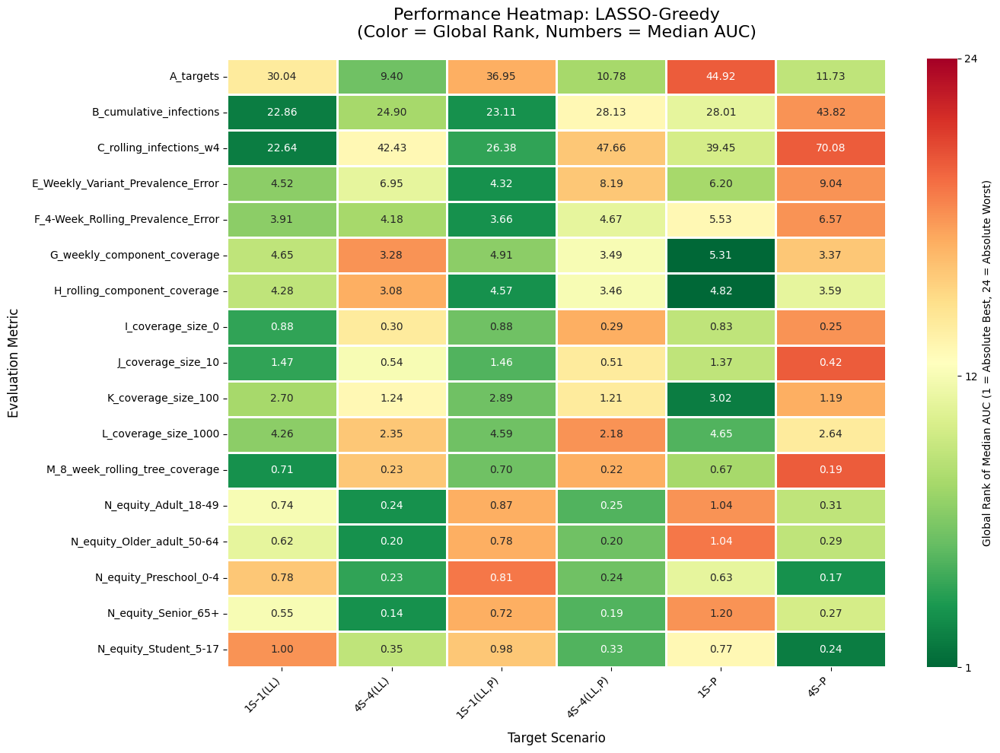

Saved: replicate_results/Heatmap_MedianRank_LASSO-Stratified.png


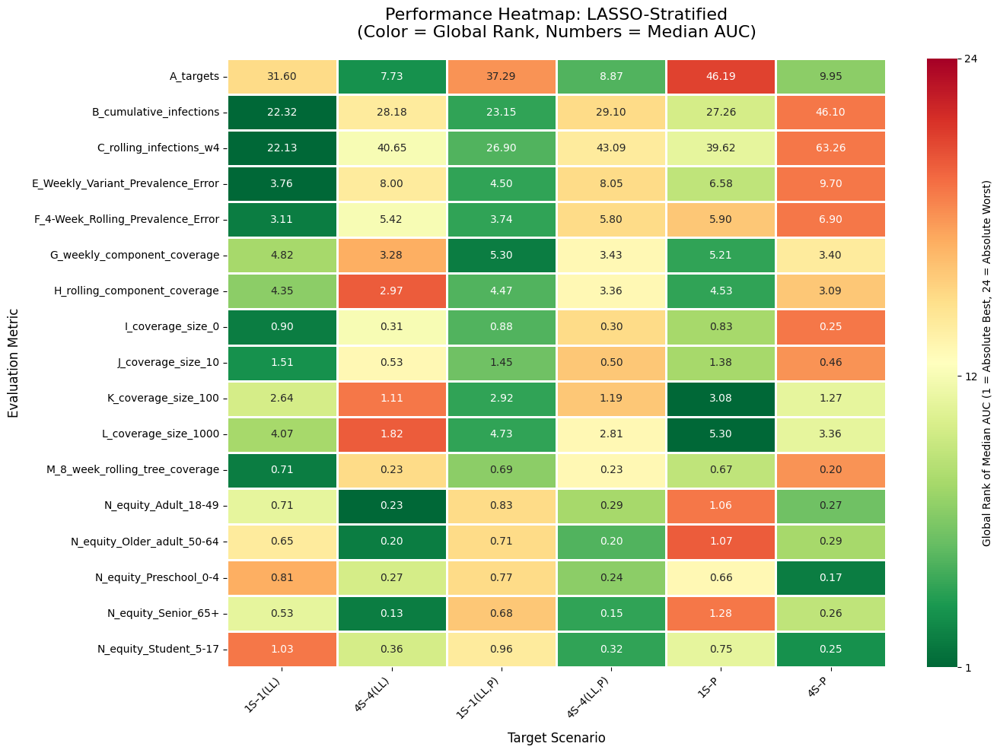

Saved: replicate_results/Heatmap_MedianRank_SURS.png


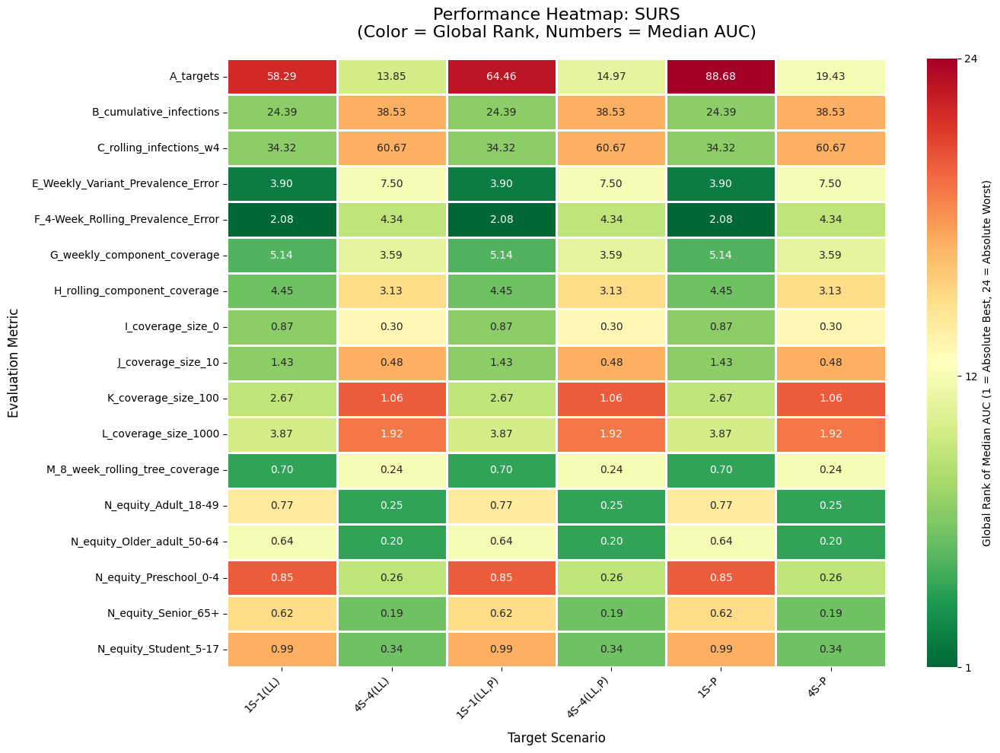

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# ==========================================
# 1. Hardcode your input and output paths here
# ==========================================
input_file = "./replicate_results/Aggregated_Median_AUC_Rankings.csv" 
output_directory = "heatmap_replicate_results"

input_path = Path(input_file)
outdir = Path(output_directory)
outdir.mkdir(parents=True, exist_ok=True)

if not input_path.exists():
    print(f"Error: Could not find '{input_path}'. Please check the path.")
else:
    # 2. Load data
    df = pd.read_csv(input_path)

    # 3. Define which metrics are "Higher is Better" (Coverage scores)
    higher_is_better_prefixes = ('G_', 'H_', 'I_', 'J_', 'K_', 'L_', 'M_')

    # ==========================================
    # FIX: Correct the inverted rankings in the CSV
    # ==========================================
    def fix_global_rank(group):
        eval_type = group['eval_type'].iloc[0]
        asc = not eval_type.startswith(higher_is_better_prefixes)
        
        # Calculate the true global rank based on median_auc
        group['rank_of_median_auc'] = group['median_auc'].rank(method="dense", ascending=asc)
        return group

    # Apply the fix grouped ONLY by eval_type (this compares all 18 combinations)
    df = df.groupby('eval_type', group_keys=False).apply(fix_global_rank)
    df.to_csv(input_path, index=False)
    print("CSV updated with corrected global 'rank_of_median_auc'.\n")
    # ==========================================

    # Sort to ensure our axes stay in logical alphabetical/numerical order
    df = df.sort_values(by=['eval_type', 'scenario_id'])

    # 4. Generate a plot for each algorithm
    algorithms = df['algorithm'].unique()
    
    # The maximum rank is the highest number found in the rank_of_median_auc column
    max_rank = int(df['rank_of_median_auc'].max())

    for algo in algorithms:
        algo_df = df[df['algorithm'] == algo]

        # Create matrices for Seaborn
        # COLOR = rank_of_median_auc
        rank_pivot = algo_df.pivot(index='eval_type', columns='scenario_label', values='rank_of_median_auc')
        # TEXT = median_auc
        auc_pivot = algo_df.pivot(index='eval_type', columns='scenario_label', values='median_auc')

        # Keep columns (scenarios) strictly ordered by scenario_id
        ordered_scenarios = algo_df[['scenario_id', 'scenario_label']].drop_duplicates().sort_values('scenario_id')['scenario_label']
        rank_pivot = rank_pivot[ordered_scenarios]
        auc_pivot = auc_pivot[ordered_scenarios]

        # 5. Plotting
        plt.figure(figsize=(14, 10))
        
        ax = sns.heatmap(
            rank_pivot, 
            annot=auc_pivot, 
            fmt=".2f",          
            cmap="RdYlGn_r", 
            vmin=1, 
            vmax=max_rank, 
            linewidths=1,
            linecolor='white',
            cbar_kws={
                'ticks': [1, max_rank // 2, max_rank], 
                'label': f'Global Rank of Median AUC (1 = Absolute Best, {max_rank} = Absolute Worst)'
            }
        )

        plt.title(f"Performance Heatmap: {algo}\n(Color = Global Rank, Numbers = Median AUC)", fontsize=16, pad=20)
        plt.xlabel("Target Scenario", fontsize=12, labelpad=10)
        plt.ylabel("Evaluation Metric", fontsize=12, labelpad=10)
        
        plt.xticks(rotation=45, ha='right')
        plt.yticks(rotation=0)
        plt.tight_layout()

        # Save to disk
        out_file = outdir / f"Heatmap_MedianRank_{algo}.png"
        plt.savefig(out_file, dpi=200, bbox_inches="tight")
        print(f"Saved: {out_file}")
        
        # Display inline in the Jupyter Notebook
        plt.show()

/tmp/ipykernel_408629/2434102902.py:62: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby('eval_type', group_keys=False).apply(process_metrics)


CSV updated with ranks and row-wise z-scores.

Saved: replicate_results_ses/Heatmap_Combined_ZScoreColor.png


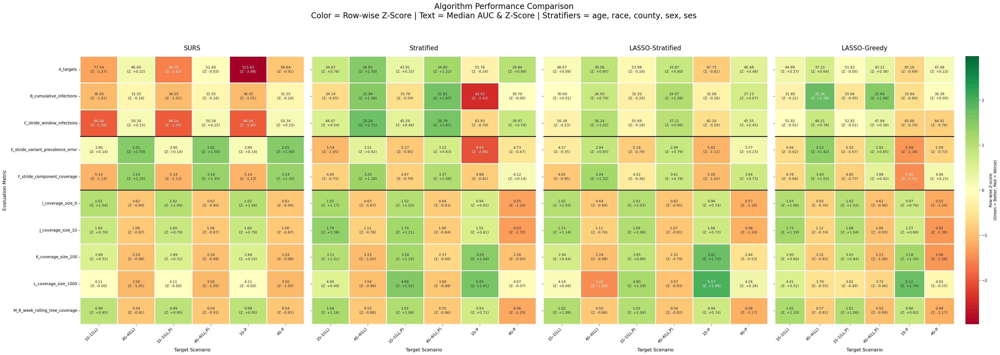


RANKING: Sum of Z-Scores across panels A, C, E, F, K, M
(Higher sum = better overall; one metric per eval family)
Rank  Algorithm                Scenario             Sum Z    Mean Z  #Panels
--------------------------------------------------------------------------------
#1    Stratified               4S–4(LL)             3.005     0.501        6
#2    Stratified               4S–4(LL,P)           2.987     0.498        6
#3    LASSO-Greedy             4S–4(LL)             2.230     0.372        6
#4    LASSO-Stratified         4S–4(LL)             2.189     0.365        6
#5    Stratified               1S–1(LL)             1.675     0.279        6
#6    LASSO-Stratified         4S–4(LL,P)           1.608     0.268        6
#7    Stratified               1S–1(LL,P)           1.391     0.232        6
#8    SURS                     4S–4(LL)             1.327     0.221        6
#9    SURS                     4S–4(LL,P)           1.073     0.179        6
#10   LASSO-Greedy             1S–

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# ==========================================
# 1. Hardcode your input and output paths here
# ==========================================
input_file = "./replicate_results_ses/Aggregated_Median_AUC_Rankings.csv"
output_directory = "replicate_results_ses"

input_path = Path(input_file)
outdir = Path(output_directory)
outdir.mkdir(parents=True, exist_ok=True)

if not input_path.exists():
    print(f"Error: Could not find '{input_path}'. Please check the path.")
else:
    # 2. Load data
    df = pd.read_csv(input_path)

    # Ignore all N metrics
    df = df[~df['eval_type'].str.startswith('N_', na=False)].copy()

    # 3. Define which metrics are "Higher is Better"
    higher_is_better_prefixes = ('G_', 'H_', 'I_', 'J_', 'K_', 'L_', 'M_')

    # ==========================================
    # 4. Calculate Rank and Row-wise Z-score
    # ==========================================
    def process_metrics(group):
        group = group.copy()

        eval_type = group['eval_type'].iloc[0]

        # asc=True means lower median_auc is better
        asc = not eval_type.startswith(higher_is_better_prefixes)

        # Rank is still saved, but NOT used for heatmap color
        group['rank_of_median_auc'] = group['median_auc'].rank(
            method="dense",
            ascending=asc
        )

        mean_val = group['median_auc'].mean()
        std_val = group['median_auc'].std()

        if std_val == 0 or pd.isna(std_val):
            group['z_score'] = 0.0
        else:
            z = (group['median_auc'] - mean_val) / std_val

            # Make positive z always mean better than average
            if asc:
                z = -z

            group['z_score'] = z

        return group

    df = df.groupby('eval_type', group_keys=False).apply(process_metrics)

    # Annotation text
    df['annot_str'] = df.apply(
        lambda row: f"{row['median_auc']:.2f}\n(Z: {row['z_score']:+.2f})",
        axis=1
    )

    # Save updated CSV
    df.to_csv(input_path, index=False)
    print("CSV updated with ranks and row-wise z-scores.\n")

    # Sort to keep axes consistent
    df = df.sort_values(by=['eval_type', 'scenario_id'])

    # ==========================================
    # 5. Setup algorithms and figure
    # ==========================================
    desired_order = ["SURS", "Stratified", "LASSO-Stratified"]

    available_algos = df['algorithm'].unique()
    algorithms = [algo for algo in desired_order if algo in available_algos]

    for algo in available_algos:
        if algo not in algorithms:
            algorithms.append(algo)

    n_algos = len(algorithms)

    fig, axes = plt.subplots(
        1,
        n_algos,
        figsize=(9 * n_algos, 12),
        sharey=True
    )

    if n_algos == 1:
        axes = [axes]

    # Symmetric color scale around zero
    max_abs_z = df['z_score'].abs().max()
    if pd.isna(max_abs_z) or max_abs_z == 0:
        max_abs_z = 1.0

    # ==========================================
    # 6. Plot each algorithm
    # ==========================================
    for i, (algo, ax) in enumerate(zip(algorithms, axes)):
        algo_df = df[df['algorithm'] == algo].copy()

        # COLOR = z-score itself
        z_pivot = algo_df.pivot(
            index='eval_type',
            columns='scenario_label',
            values='z_score'
        )

        # TEXT = median AUC + z-score
        annot_pivot = algo_df.pivot(
            index='eval_type',
            columns='scenario_label',
            values='annot_str'
        )

        # Keep columns ordered by scenario_id
        ordered_scenarios = (
            algo_df[['scenario_id', 'scenario_label']]
            .drop_duplicates()
            .sort_values('scenario_id')['scenario_label']
        )

        z_pivot = z_pivot[ordered_scenarios]
        annot_pivot = annot_pivot[ordered_scenarios]

        show_cbar = (i == n_algos - 1)

        sns.heatmap(
            z_pivot,
            annot=annot_pivot,
            fmt="",
            cmap="RdYlGn",      # green = better, red = worse
            center=0,
            vmin=-max_abs_z,
            vmax=max_abs_z,
            linewidths=1,
            linecolor='white',
            annot_kws={"size": 9},
            cbar=show_cbar,
            cbar_kws={
                'label': 'Row-wise Z-score\n(Green = Better, Red = Worse)'
            } if show_cbar else None,
            ax=ax
        )

        # Add thicker separator lines after selected metric families
        break_after_prefixes = {'C', 'F'}

        row_labels = z_pivot.index.tolist()

        for j, label in enumerate(row_labels[:-1]):
            prefix_now = label.split('_')[0]
            if prefix_now in break_after_prefixes:
                ax.hlines(
                    j + 1,
                    *ax.get_xlim(),
                    colors='black',
                    linewidth=2
                )

        ax.set_title(f"{algo}", fontsize=16, pad=15)
        ax.set_xlabel("Target Scenario", fontsize=12, labelpad=10)

        if i == 0:
            ax.set_ylabel("Evaluation Metric", fontsize=12, labelpad=10)
        else:
            ax.set_ylabel("")

        ax.set_xticklabels(
            ax.get_xticklabels(),
            rotation=45,
            ha='right'
        )

    # ==========================================
    # 7. Finalize and save figure
    # ==========================================
    fig.suptitle(
        "Algorithm Performance Comparison\n"
        "Color = Row-wise Z-Score | Text = Median AUC & Z-Score | "
        "Stratifiers = age, race, county, sex, ses",
        fontsize=20,
        y=1.05
    )

    plt.tight_layout()

    out_file = outdir / "Heatmap_Combined_ZScoreColor.png"
    plt.savefig(out_file, dpi=200, bbox_inches="tight")
    print(f"Saved: {out_file}")

    plt.show()

    # ==========================================
    # 8. RANKING: Sum of Z-scores for selected panels
    # ==========================================
    SELECTED_PREFIXES = ("A_", "C_", "E_", "F_", "K_", "M_")

    df_sel = df[df['eval_type'].str.startswith(SELECTED_PREFIXES)].copy()

    if df_sel.empty:
        print("\n[WARN] No rows matched panels A, C, E, F, K, M. Skipping ranking.")
    else:
        df_sel['algo_scenario'] = (
            df_sel['algorithm'] + " | " + df_sel['scenario_label']
        )

        ranking = (
            df_sel
            .groupby(['algorithm', 'scenario_label', 'algo_scenario'])
            .agg(
                sum_z=('z_score', 'sum'),
                mean_z=('z_score', 'mean'),
                n_metrics=('z_score', 'count'),
            )
            .reset_index()
            .sort_values('sum_z', ascending=False)
        )

        ranking['rank'] = range(1, len(ranking) + 1)

        print("\n" + "=" * 80)
        print("RANKING: Sum of Z-Scores across panels A, C, E, F, K, M")
        print("(Higher sum = better overall; one metric per eval family)")
        print("=" * 80)
        print(
            f"{'Rank':<6}"
            f"{'Algorithm':<25}"
            f"{'Scenario':<16}"
            f"{'Sum Z':>10}"
            f"{'Mean Z':>10}"
            f"{'#Panels':>9}"
        )
        print("-" * 80)

        for _, row in ranking.iterrows():
            print(
                f"#{int(row['rank']):<5}"
                f"{row['algorithm']:<25}"
                f"{row['scenario_label']:<16}"
                f"{row['sum_z']:>10.3f}"
                f"{row['mean_z']:>10.3f}"
                f"{int(row['n_metrics']):>9}"
            )

        print("\n" + "-" * 80)
        print("BEST SCENARIO PER ALGORITHM:")
        print("-" * 80)

        best = ranking.loc[ranking.groupby('algorithm')['sum_z'].idxmax()]
        best = best.sort_values('sum_z', ascending=False)

        for _, row in best.iterrows():
            print(
                f"  {row['algorithm']:<25} → "
                f"{row['scenario_label']:<16} "
                f"(sum_z = {row['sum_z']:+.3f})"
            )

        rank_csv = outdir / "Ranking_Selected_Panels_ACFHKM.csv"
        ranking.to_csv(rank_csv, index=False)
        print(f"\nSaved ranking: {rank_csv}")

1S scenario labels:
['1S–1(LL)', '1S–1(LL,P)', '1S–P']

4S scenario labels:
['4S–4(LL)', '4S–4(LL,P)', '4S–P']

Rows in 1S subset: 120
Rows in 4S subset: 120
Saved subset scores: replicate_results/Scored_1S_ZScores.csv


/tmp/ipykernel_480991/4033684969.py:98: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_sub = df_sub.groupby('eval_type', group_keys=False).apply(process_metrics)


Saved: replicate_results/Heatmap_1S_ZScoreColor.png


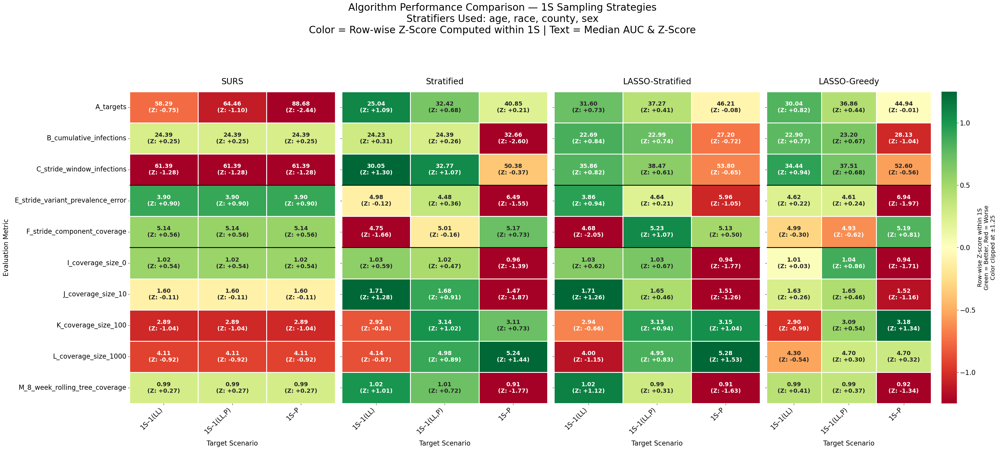

/tmp/ipykernel_480991/4033684969.py:98: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_sub = df_sub.groupby('eval_type', group_keys=False).apply(process_metrics)


Saved subset scores: replicate_results/Scored_4S_ZScores.csv
Saved: replicate_results/Heatmap_4S_ZScoreColor.png


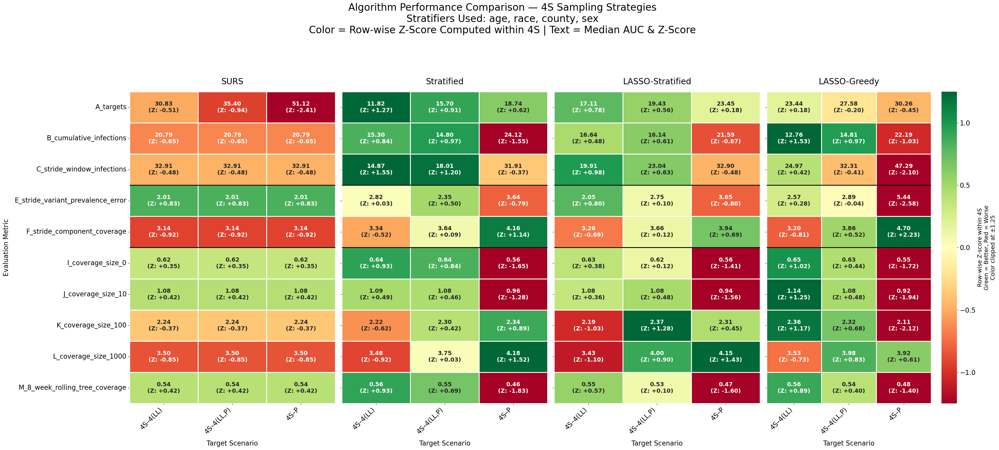


RANKING: 1S | Sum of Z-Scores across panels A, C, E, F, K, M
Rank  Algorithm                Scenario               Sum Z    Mean Z  #Panels
------------------------------------------------------------------------------------------
#1    Stratified               1S–1(LL,P)             3.691     0.615        6
#2    LASSO-Stratified         1S–1(LL,P)             3.543     0.590        6
#3    LASSO-Greedy             1S–1(LL,P)             1.654     0.276        6
#4    LASSO-Greedy             1S–1(LL)               1.086     0.181        6
#5    LASSO-Stratified         1S–1(LL)               0.892     0.149        6
#6    Stratified               1S–1(LL)               0.780     0.130        6
#7    SURS                     1S–1(LL)              -1.336    -0.223        6
#8    SURS                     1S–1(LL,P)            -1.679    -0.280        6
#9    LASSO-Greedy             1S–P                  -1.723    -0.287        6
#10   LASSO-Stratified         1S–P                  -1.8

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# Stratifiers used in this experiment
STRATIFIERS_USED = ["age", "race", "county", "sex"]

# Larger font settings for heatmap
CELL_TEXT_SIZE = 14
AXIS_LABEL_SIZE = 16
TICK_LABEL_SIZE = 16
ALGO_TITLE_SIZE = 20
FIG_TITLE_SIZE = 24
CBAR_LABEL_SIZE = 14
# ==========================================
# 1. Hardcode your input and output paths here
# ==========================================
input_file = "./replicate_results/Aggregated_Median_AUC_Rankings.csv"
output_directory = "replicate_results"

input_path = Path(input_file)
outdir = Path(output_directory)
outdir.mkdir(parents=True, exist_ok=True)

# ==========================================
# 2. Settings
# ==========================================

# Metrics where higher median_auc means better performance
higher_is_better_prefixes = ('F_', 'I_', 'J_', 'K_', 'L_', 'M_')

# Representative panels for ranking summary
SELECTED_PREFIXES = ("A_", "C_", "E_", "F_", "K_", "M_")

# Stronger color contrast for heatmap
# Smaller value = stronger colors; try 1.0, 1.25, 1.5, or 2.0
z_clip = 1.25

# Desired algorithm order
desired_order = ["SURS", "Stratified", "LASSO-Stratified", "LASSO-Greedy"]


# ==========================================
# 3. Helper functions
# ==========================================

def normalize_label(label):
    """
    Normalize scenario labels so both '-' and '–' are treated the same.
    """
    if pd.isna(label):
        return ""
    return str(label).strip().replace("–", "-")


def compute_scores(df_sub):
    """
    Recompute ranks and row-wise z-scores inside a given subset.

    Important:
    The z-score is computed within each eval_type row and within the current
    subset only, so the 1S heatmap and 4S heatmap each get their own z-scores.
    """
    df_sub = df_sub.copy()

    def process_metrics(group):
        group = group.copy()
        eval_type = group['eval_type'].iloc[0]

        # asc=True means lower median_auc is better
        asc = not eval_type.startswith(higher_is_better_prefixes)

        # Rank within this subset
        group['rank_of_median_auc'] = group['median_auc'].rank(
            method="dense",
            ascending=asc
        )

        # Row-wise z-score within this subset
        mean_val = group['median_auc'].mean()
        std_val = group['median_auc'].std()

        if std_val == 0 or pd.isna(std_val):
            group['z_score'] = 0.0
        else:
            z = (group['median_auc'] - mean_val) / std_val

            # Positive z-score always means better than average
            if asc:
                z = -z

            group['z_score'] = z

        return group

    df_sub = df_sub.groupby('eval_type', group_keys=False).apply(process_metrics)

    df_sub['annot_str'] = df_sub.apply(
        lambda row: f"{row['median_auc']:.2f}\n(Z: {row['z_score']:+.2f})",
        axis=1
    )

    return df_sub


def plot_subset_heatmap(df_sub, subset_name, out_filename):
    """
    Generate one heatmap for one stride subset, e.g. 1S or 4S.
    """
    if df_sub.empty:
        print(f"[WARN] No rows found for subset: {subset_name}")
        return None

    # Recompute z-score only inside this subset
    df_sub = compute_scores(df_sub)

    # Save scored subset for checking/debugging
    subset_csv = outdir / f"Scored_{subset_name}_ZScores.csv"
    df_sub.to_csv(subset_csv, index=False)
    print(f"Saved subset scores: {subset_csv}")

    # Sort to keep axes consistent
    df_sub = df_sub.sort_values(by=['eval_type', 'scenario_id'])

    available_algos = df_sub['algorithm'].unique()
    algorithms = [algo for algo in desired_order if algo in available_algos]

    for algo in available_algos:
        if algo not in algorithms:
            algorithms.append(algo)

    n_algos = len(algorithms)

    fig, axes = plt.subplots(
        1,
        n_algos,
        figsize=(8.5 * n_algos, 14),
        sharey=True
    )

    if n_algos == 1:
        axes = [axes]

    # Symmetric z-score color scale with clipping for stronger contrast
    max_abs_z_data = df_sub['z_score'].abs().max()

    if pd.isna(max_abs_z_data) or max_abs_z_data == 0:
        max_abs_z = z_clip
    else:
        max_abs_z = min(max_abs_z_data, z_clip)

    for i, (algo, ax) in enumerate(zip(algorithms, axes)):
        algo_df = df_sub[df_sub['algorithm'] == algo].copy()

        if algo_df.empty:
            ax.axis("off")
            continue

        # COLOR = z-score itself
        z_pivot = algo_df.pivot(
            index='eval_type',
            columns='scenario_label',
            values='z_score'
        )

        # TEXT = median AUC + z-score
        annot_pivot = algo_df.pivot(
            index='eval_type',
            columns='scenario_label',
            values='annot_str'
        )

        # Keep columns ordered by scenario_id
        ordered_scenarios = (
            algo_df[['scenario_id', 'scenario_label']]
            .drop_duplicates()
            .sort_values('scenario_id')['scenario_label']
            .tolist()
        )

        ordered_scenarios = [c for c in ordered_scenarios if c in z_pivot.columns]

        z_pivot = z_pivot[ordered_scenarios]
        annot_pivot = annot_pivot[ordered_scenarios]

        show_cbar = (i == n_algos - 1)

        sns.heatmap(
            z_pivot,
            annot=annot_pivot,
            fmt="",
            cmap="RdYlGn",       # green = better, red = worse
            center=0,
            vmin=-max_abs_z,
            vmax=max_abs_z,
            linewidths=1,
            linecolor='white',
            annot_kws={
                "size": CELL_TEXT_SIZE,
                "weight": "bold"
            },
            cbar=show_cbar,
            cbar_kws={
                'label': (
                    f'Row-wise Z-score within {subset_name}\n'
                    f'Green = Better, Red = Worse\n'
                    f'Color clipped at ±{max_abs_z:.2f}'
                )
            } if show_cbar else None,
            ax=ax
        )

        # Add thicker separator lines after selected metric families
        break_after_prefixes = {'C', 'F'}
        row_labels = z_pivot.index.tolist()

        for j, label in enumerate(row_labels[:-1]):
            prefix_now = str(label).split('_')[0]
            if prefix_now in break_after_prefixes:
                ax.hlines(
                    j + 1,
                    *ax.get_xlim(),
                    colors='black',
                    linewidth=2
                )

        ax.set_title(f"{algo}", fontsize=ALGO_TITLE_SIZE, pad=18)
        ax.set_xlabel("Target Scenario", fontsize=AXIS_LABEL_SIZE, labelpad=12)
        
        if i == 0:
            ax.set_ylabel("Evaluation Metric", fontsize=AXIS_LABEL_SIZE, labelpad=12)
        else:
            ax.set_ylabel("")

        ax.set_xticklabels(
            ax.get_xticklabels(),
            rotation=45,
            ha='right'
        )

        ax.tick_params(axis='x', labelsize=TICK_LABEL_SIZE)
        ax.tick_params(axis='y', labelsize=TICK_LABEL_SIZE)

    stratifier_text = ", ".join(STRATIFIERS_USED)

    if show_cbar:
        cbar = ax.collections[0].colorbar
        cbar.ax.tick_params(labelsize=TICK_LABEL_SIZE)
        cbar.set_label(
            f'Row-wise Z-score within {subset_name}\n'
            f'Green = Better, Red = Worse\n'
            f'Color clipped at ±{max_abs_z:.2f}',
            fontsize=CBAR_LABEL_SIZE
        )
    
    fig.suptitle(
        f"Algorithm Performance Comparison — {subset_name} Sampling Strategies\n"
        f"Stratifiers Used: {stratifier_text}\n"
        f"Color = Row-wise Z-Score Computed within {subset_name} | "
        f"Text = Median AUC & Z-Score",
        fontsize=FIG_TITLE_SIZE,
        y=1.08
    )

    plt.tight_layout()

    out_file = outdir / out_filename
    plt.savefig(out_file, dpi=200, bbox_inches="tight")
    print(f"Saved: {out_file}")

    plt.show()

    return df_sub


def print_subset_ranking(df_scored, subset_name):
    """
    Print and save ranking summary for one subset.
    """
    if df_scored is None or df_scored.empty:
        print(f"[WARN] No ranking for {subset_name}")
        return

    df_sel = df_scored[df_scored['eval_type'].str.startswith(SELECTED_PREFIXES)].copy()

    if df_sel.empty:
        print(f"\n[WARN] No rows matched selected panels for {subset_name}.")
        return

    ranking = (
        df_sel
        .groupby(['algorithm', 'scenario_label'])
        .agg(
            sum_z=('z_score', 'sum'),
            mean_z=('z_score', 'mean'),
            n_metrics=('z_score', 'count')
        )
        .reset_index()
        .sort_values('sum_z', ascending=False)
    )

    ranking['rank'] = range(1, len(ranking) + 1)

    print("\n" + "=" * 90)
    print(f"RANKING: {subset_name} | Sum of Z-Scores across panels A, C, E, F, K, M")
    print("=" * 90)
    print(
        f"{'Rank':<6}"
        f"{'Algorithm':<25}"
        f"{'Scenario':<18}"
        f"{'Sum Z':>10}"
        f"{'Mean Z':>10}"
        f"{'#Panels':>9}"
    )
    print("-" * 90)

    for _, row in ranking.iterrows():
        print(
            f"#{int(row['rank']):<5}"
            f"{row['algorithm']:<25}"
            f"{row['scenario_label']:<18}"
            f"{row['sum_z']:>10.3f}"
            f"{row['mean_z']:>10.3f}"
            f"{int(row['n_metrics']):>9}"
        )

    print("\n" + "-" * 90)
    print(f"BEST SCENARIO PER ALGORITHM — {subset_name}:")
    print("-" * 90)

    best = ranking.loc[ranking.groupby('algorithm')['sum_z'].idxmax()]
    best = best.sort_values('sum_z', ascending=False)

    for _, row in best.iterrows():
        print(
            f"  {row['algorithm']:<25} → "
            f"{row['scenario_label']:<18} "
            f"(sum_z = {row['sum_z']:+.3f})"
        )

    rank_csv = outdir / f"Ranking_Selected_Panels_{subset_name}.csv"
    ranking.to_csv(rank_csv, index=False)
    print(f"\nSaved ranking: {rank_csv}")


# ==========================================
# 4. Main script
# ==========================================

if not input_path.exists():
    print(f"Error: Could not find '{input_path}'. Please check the path.")

else:
    # Load data
    df = pd.read_csv(input_path)

    # Ignore all N metrics
    df = df[~df['eval_type'].str.startswith('N_', na=False)].copy()

    # Normalize scenario labels for filtering
    df['scenario_label_norm'] = df['scenario_label'].apply(normalize_label)

    # ==========================================
    # Split into stride groups
    # ==========================================

    # Includes:
    #   1S-1
    #   1S-P
    #   1S-1(LL)
    #   1S-1(LL,P)
    #   1S-P
    df_1s = df[df['scenario_label_norm'].str.startswith("1S-")].copy()

    # Includes:
    #   4S-4
    #   4S-P
    #   4S-4(LL)
    #   4S-4(LL,P)
    #   4S-P
    df_4s = df[df['scenario_label_norm'].str.startswith("4S-")].copy()

    print("1S scenario labels:")
    print(sorted(df_1s['scenario_label'].dropna().unique()))

    print("\n4S scenario labels:")
    print(sorted(df_4s['scenario_label'].dropna().unique()))

    print(f"\nRows in 1S subset: {len(df_1s)}")
    print(f"Rows in 4S subset: {len(df_4s)}")

    # ==========================================
    # Generate separate heatmaps
    # ==========================================

    scored_1s = plot_subset_heatmap(
        df_1s,
        subset_name="1S",
        out_filename="Heatmap_1S_ZScoreColor.png"
    )

    scored_4s = plot_subset_heatmap(
        df_4s,
        subset_name="4S",
        out_filename="Heatmap_4S_ZScoreColor.png"
    )

    # ==========================================
    # Rankings for each subset
    # ==========================================

    print_subset_ranking(scored_1s, "1S")
    print_subset_ranking(scored_4s, "4S")


Saved: replicate_results/Summary_Trajectory_by_Metric.png


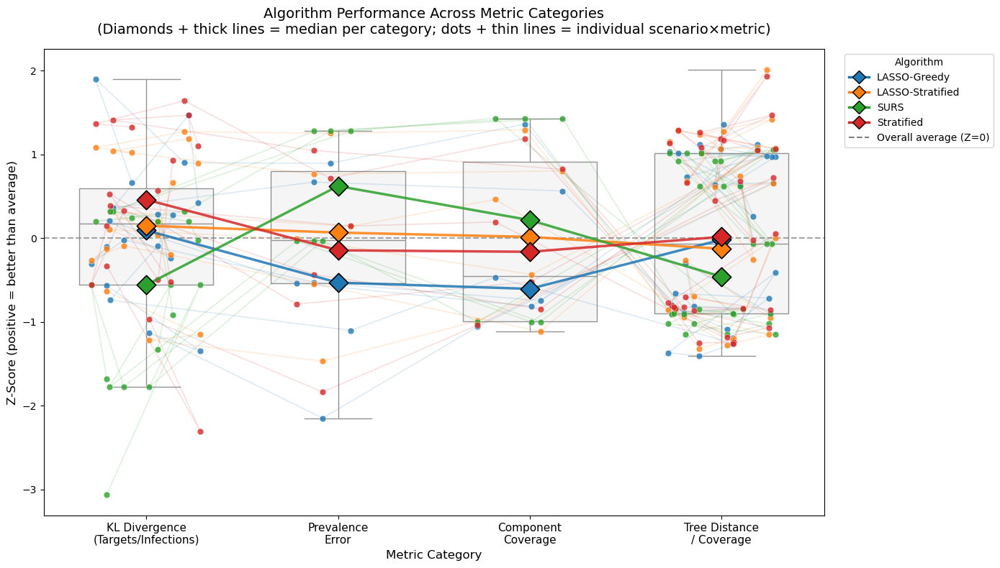

In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import seaborn as sns
from pathlib import Path

# ==========================================
# 1. Load the data
# ==========================================
input_file = "replicate_results/Aggregated_Median_AUC_Rankings.csv"
df = pd.read_csv(input_file)

if 'z_score' not in df.columns:
    print("Error: 'z_score' column missing. Please run the heatmap script first.")
else:
    # ==========================================
    # 2. Map Metrics to Categories
    # ==========================================
    def assign_category(eval_type):
        if eval_type.startswith(('A_', 'B_', 'C_')):
            return "KL Divergence\n(Targets/Infections)"
        elif eval_type.startswith(('E_')):
            return "Prevalence\nError"
        elif eval_type.startswith(('F_')):
            return "Component\nCoverage"
        elif eval_type.startswith(('I_', 'J_', 'K_', 'L_', 'M_')):
            return "Tree Distance\n/ Coverage"
        else:
            return "Other"

    df['metric_category'] = df['eval_type'].apply(assign_category)

    # Unique task = one (eval_type, scenario) combo
    df['task_id'] = df['eval_type'] + "_" + df['scenario_label']

    # ==========================================
    # 3. Order metric categories on x-axis
    # ==========================================
    cat_order = [
        "KL Divergence\n(Targets/Infections)",
        "Prevalence\nError",
        "Component\nCoverage",
        "Tree Distance\n/ Coverage",
    ]
    # Keep only categories that exist in data
    cat_order = [c for c in cat_order if c in df['metric_category'].unique()]
    # Append any extras
    for c in df['metric_category'].unique():
        if c not in cat_order:
            cat_order.append(c)

    cat_to_x = {cat: i for i, cat in enumerate(cat_order)}
    df['x_base'] = df['metric_category'].map(cat_to_x)

    # ==========================================
    # 4. Assign colors per algorithm
    # ==========================================
    algo_order = sorted(df['algorithm'].unique())

    # Use a qualitative colormap with good separation
    if len(algo_order) <= 10:
        cmap = plt.get_cmap('tab10')
    else:
        cmap = plt.get_cmap('tab20')
    algo_colors = {algo: cmap(i) for i, algo in enumerate(algo_order)}

    # ==========================================
    # 5. Deterministic jitter per task_id
    # ==========================================
    np.random.seed(42)
    unique_tasks = df['task_id'].unique()
    jitter_map = {task: np.random.uniform(-0.3, 0.3) for task in unique_tasks}
    df['x_jittered'] = df['x_base'] + df['task_id'].map(jitter_map)

    # ==========================================
    # 6. Plot
    # ==========================================
    fig, ax = plt.subplots(figsize=(14, 8))

    # A. Boxplot per metric category (background, all algorithms pooled)
    sns.boxplot(
        data=df,
        x='metric_category',
        y='z_score',
        order=cat_order,
        color='whitesmoke',
        width=0.7,
        showfliers=False,
        zorder=1,
        ax=ax,
    )

    ax.axhline(0, color='grey', linestyle='--', linewidth=1.5, alpha=0.7, zorder=2)

    # B. Draw connecting lines per (algorithm, task_id)
    #    Each task_id spans multiple metric categories — but actually each
    #    task_id lives in exactly one category.  So the "slope" lines connect
    #    the SAME algorithm across different metric categories.
    #
    #    Reframe: for each algorithm, for each scenario_label, draw a line
    #    connecting its z_score across metric categories.
    df['scenario_label_clean'] = df['scenario_label']

    for algo in algo_order:
        algo_df = df[df['algorithm'] == algo]
        color = algo_colors[algo]

        for scen, scen_group in algo_df.groupby('scenario_label_clean'):
            if len(scen_group) < 2:
                continue
            scen_group = scen_group.sort_values('x_base')
            ax.plot(
                scen_group['x_jittered'], scen_group['z_score'],
                color=color, alpha=0.15, linewidth=1.2, zorder=3,
            )

        # Draw dots for ALL points of this algorithm
        ax.scatter(
            algo_df['x_jittered'], algo_df['z_score'],
            color=color, edgecolor='white', linewidth=0.4,
            s=40, alpha=0.8, zorder=4,
        )

    # C. Overlay per-algorithm median markers (large, prominent)
    for algo in algo_order:
        algo_df = df[df['algorithm'] == algo]
        medians = algo_df.groupby('metric_category')['z_score'].median()
        color = algo_colors[algo]

        for cat in cat_order:
            if cat not in medians.index:
                continue
            x = cat_to_x[cat]
            y = medians[cat]
            ax.scatter(
                x, y,
                color=color, edgecolor='black', linewidth=1.2,
                s=180, zorder=6, marker='D',
            )

        # Connect medians with a thick line
        xs = [cat_to_x[c] for c in cat_order if c in medians.index]
        ys = [medians[c] for c in cat_order if c in medians.index]
        if len(xs) >= 2:
            ax.plot(xs, ys, color=color, linewidth=2.5, alpha=0.85, zorder=5)

    # D. Formatting
    ax.set_xticks(range(len(cat_order)))
    ax.set_xticklabels(cat_order, fontsize=11)
    ax.set_ylabel("Z-Score (positive = better than average)", fontsize=12)
    ax.set_xlabel("Metric Category", fontsize=12)
    ax.set_title(
        "Algorithm Performance Across Metric Categories\n"
        "(Diamonds + thick lines = median per category; dots + thin lines = individual scenario×metric)",
        fontsize=14, pad=15,
    )

    # Legend: one entry per algorithm
    legend_handles = [
        mlines.Line2D([], [], color=algo_colors[a], marker='D', markersize=9,
                       markeredgecolor='black', linestyle='-', linewidth=2.5, label=a)
        for a in algo_order
    ]
    legend_handles.append(
        mlines.Line2D([], [], color='grey', linestyle='--', linewidth=1.5,
                       label='Overall average (Z=0)')
    )
    ax.legend(
        handles=legend_handles, title="Algorithm",
        bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=10,
    )

    plt.tight_layout()

    out_file = Path("replicate_results/Summary_Trajectory_by_Metric.png")
    out_file.parent.mkdir(parents=True, exist_ok=True)
    plt.savefig(out_file, dpi=200, bbox_inches='tight')
    print(f"\nSaved: {out_file}")
    plt.show()


Saved Mugration Heatmap to: replicate_results/Heatmap_Mugration_Metrics.png


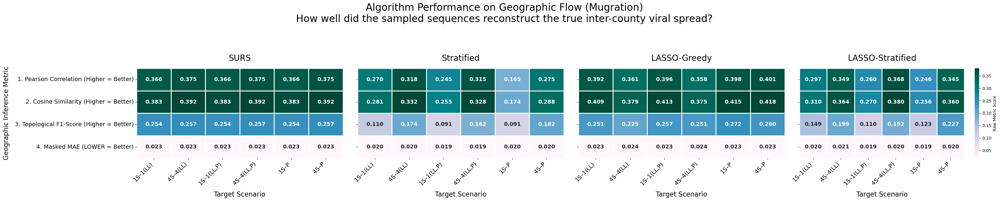

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# ==========================================
# 1. Load the Mugration Data
# ==========================================
input_file = "./replicate_results/Aggregated_Mugration_Metrics.csv"
outdir = Path("./replicate_results")

if not Path(input_file).exists():
    print(f"Error: Could not find '{input_file}'.")
else:
    df_mug = pd.read_csv(input_file)

    # We want to reshape this so 'Metrics' are rows and 'Scenarios' are columns
    # Melt turns our 4 metric columns into two columns: 'metric_name' and 'score'
    df_melt = df_mug.melt(
        id_vars=['algorithm', 'scenario_id', 'scenario_label'],
        value_vars=['median_pearson', 'median_cosine', 'median_f1', 'median_masked_mae'],
        var_name='eval_type',
        value_name='score'
    )

    # Clean up the names for the plot
    metric_name_map = {
        'median_pearson': '1. Pearson Correlation (Higher = Better)',
        'median_cosine': '2. Cosine Similarity (Higher = Better)',
        'median_f1': '3. Topological F1-Score (Higher = Better)',
        'median_masked_mae': '4. Masked MAE (LOWER = Better)'
    }
    df_melt['eval_type'] = df_melt['eval_type'].map(metric_name_map)
    df_melt = df_melt.sort_values(by=['eval_type', 'scenario_id'])

    # ==========================================
    # 2. Setup Figure
    # ==========================================
    # We want LASSO-Stratified to be last, as it's typically your best performer
    desired_order = ["SURS", "Stratified", "LASSO-Greedy", "LASSO-Stratified"]
    algorithms = [a for a in desired_order if a in df_melt['algorithm'].unique()]
    n_algos = len(algorithms)

    fig, axes = plt.subplots(1, n_algos, figsize=(8.5 * n_algos, 6), sharey=True)
    if n_algos == 1: axes = [axes]

    # ==========================================
    # 3. Plot Each Algorithm
    # ==========================================
    for i, (algo, ax) in enumerate(zip(algorithms, axes)):
        algo_df = df_melt[df_melt['algorithm'] == algo]

        # Pivot to Matrix format
        pivot_df = algo_df.pivot(index='eval_type', columns='scenario_label', values='score')
        
        # Keep scenarios ordered correctly
        ordered_scenarios = algo_df[['scenario_id', 'scenario_label']].drop_duplicates().sort_values('scenario_id')['scenario_label']
        pivot_df = pivot_df[ordered_scenarios]

        # For color mapping, we have a mix of Higher-is-better and Lower-is-better. 
        # Standardizing it visually using a blue/purple sequential map is safest for raw numbers.
        sns.heatmap(
            pivot_df,
            annot=True,
            fmt=".3f",
            cmap="PuBuGn", # A nice sequential colormap (darker = higher number)
            linewidths=1,
            linecolor='white',
            annot_kws={"size": 13, "weight": "bold"},
            cbar=(i == n_algos - 1),
            cbar_kws={'label': 'Raw Metric Score'} if (i == n_algos - 1) else None,
            ax=ax
        )

        ax.set_title(f"{algo}", fontsize=20, pad=18)
        ax.set_xlabel("Target Scenario", fontsize=16, labelpad=12)
        
        if i == 0:
            ax.set_ylabel("Geographic Inference Metric", fontsize=16, labelpad=12)
        else:
            ax.set_ylabel("")

        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
        ax.tick_params(axis='x', labelsize=14)
        ax.tick_params(axis='y', labelsize=14)

    fig.suptitle(
        "Algorithm Performance on Geographic Flow (Mugration)\n"
        "How well did the sampled sequences reconstruct the true inter-county viral spread?",
        fontsize=24, y=1.12
    )

    plt.tight_layout()
    out_file = outdir / "Heatmap_Mugration_Metrics.png"
    plt.savefig(out_file, dpi=200, bbox_inches="tight")
    print(f"\nSaved Mugration Heatmap to: {out_file}")
    plt.show()

Saved: replicate_results/Heatmap_Mugration_ZScoreColor.png


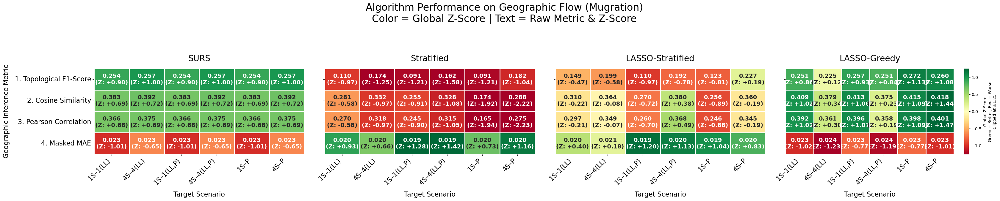

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

input_file = "./replicate_results/Aggregated_Mugration_Metrics.csv"
outdir = Path("./replicate_results")

if not Path(input_file).exists():
    print(f"Error: Could not find '{input_file}'.")
else:
    df_mug = pd.read_csv(input_file)

    # 1. Melt raw scores
    df_raw = df_mug.melt(id_vars=['algorithm', 'scenario_id', 'scenario_label'],
                         value_vars=['median_f1', 'median_cosine', 'median_pearson', 'median_masked_mae'],
                         var_name='metric', value_name='raw_score')
    df_raw['eval_type'] = df_raw['metric'].str.replace('median_', '')

    # 2. Melt Z-scores
    df_z = df_mug.melt(id_vars=['algorithm', 'scenario_id', 'scenario_label'],
                       value_vars=['z_score_f1', 'z_score_cosine', 'z_score_pearson', 'z_score_masked_mae'],
                       var_name='z_metric', value_name='z_score')
    df_z['eval_type'] = df_z['z_metric'].str.replace('z_score_', '')

    # 3. Merge them together so we have raw values (for text) and z_scores (for color)
    df_merged = pd.merge(df_raw, df_z[['algorithm', 'scenario_id', 'eval_type', 'z_score']], 
                         on=['algorithm', 'scenario_id', 'eval_type'])

    # Create the unified annotation string
    df_merged['annot_str'] = df_merged.apply(lambda row: f"{row['raw_score']:.3f}\n(Z: {row['z_score']:+.2f})", axis=1)

    # Clean up names for the plot
    metric_name_map = {
        'f1': '1. Topological F1-Score',
        'cosine': '2. Cosine Similarity',
        'pearson': '3. Pearson Correlation',
        'masked_mae': '4. Masked MAE'
    }
    df_merged['eval_type'] = df_merged['eval_type'].map(metric_name_map)
    df_merged = df_merged.sort_values(by=['eval_type', 'scenario_id'])

    # 4. Plotting Setup
    desired_order = ["SURS", "Stratified", "LASSO-Stratified", "LASSO-Greedy"]
    available_algos = df_merged['algorithm'].unique()
    algorithms = [a for a in desired_order if a in available_algos] + [a for a in available_algos if a not in desired_order]
    
    n_algos = len(algorithms)
    fig, axes = plt.subplots(1, n_algos, figsize=(8.5 * n_algos, 6), sharey=True)
    if n_algos == 1: axes = [axes]

    z_clip = 1.25
    max_abs_z = min(df_merged['z_score'].abs().max(), z_clip)

    # 5. Plotting Loop
    for i, (algo, ax) in enumerate(zip(algorithms, axes)):
        algo_df = df_merged[df_merged['algorithm'] == algo]
        
        z_pivot = algo_df.pivot(index='eval_type', columns='scenario_label', values='z_score')
        annot_pivot = algo_df.pivot(index='eval_type', columns='scenario_label', values='annot_str')
        
        ordered_scenarios = algo_df[['scenario_id', 'scenario_label']].drop_duplicates().sort_values('scenario_id')['scenario_label']
        z_pivot = z_pivot[ordered_scenarios]
        annot_pivot = annot_pivot[ordered_scenarios]

        show_cbar = (i == n_algos - 1)
        sns.heatmap(
            z_pivot, annot=annot_pivot, fmt="", cmap="RdYlGn", center=0,
            vmin=-max_abs_z, vmax=max_abs_z, linewidths=1, linecolor='white',
            annot_kws={"size": 14, "weight": "bold"}, cbar=show_cbar,
            cbar_kws={'label': f'Global Z-Score\nGreen = Better, Red = Worse\nClipped at ±{max_abs_z:.2f}'} if show_cbar else None,
            ax=ax
        )

        ax.set_title(f"{algo}", fontsize=20, pad=18)
        ax.set_xlabel("Target Scenario", fontsize=16, labelpad=12)
        ax.set_ylabel("Geographic Inference Metric" if i == 0 else "", fontsize=16, labelpad=12)
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
        ax.tick_params(axis='both', labelsize=16)

    fig.suptitle("Algorithm Performance on Geographic Flow (Mugration)\nColor = Global Z-Score | Text = Raw Metric & Z-Score", fontsize=24, y=1.12)
    plt.tight_layout()
    plt.savefig(outdir / "Heatmap_Mugration_ZScoreColor.png", dpi=500, bbox_inches="tight")
    print(f"Saved: {outdir / 'Heatmap_Mugration_ZScoreColor.png'}")
    plt.show()

Saved: replicate_results/Heatmap_1S_ZScoreColor.png


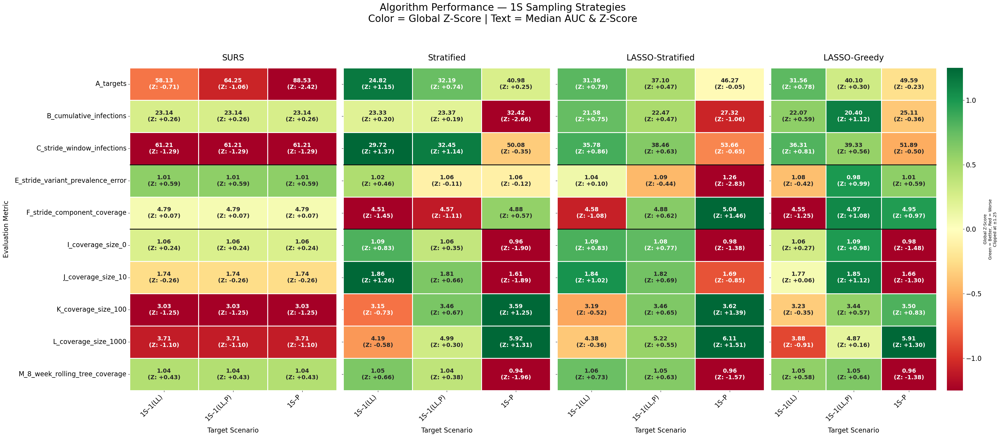

Saved: replicate_results/Heatmap_4S_ZScoreColor.png


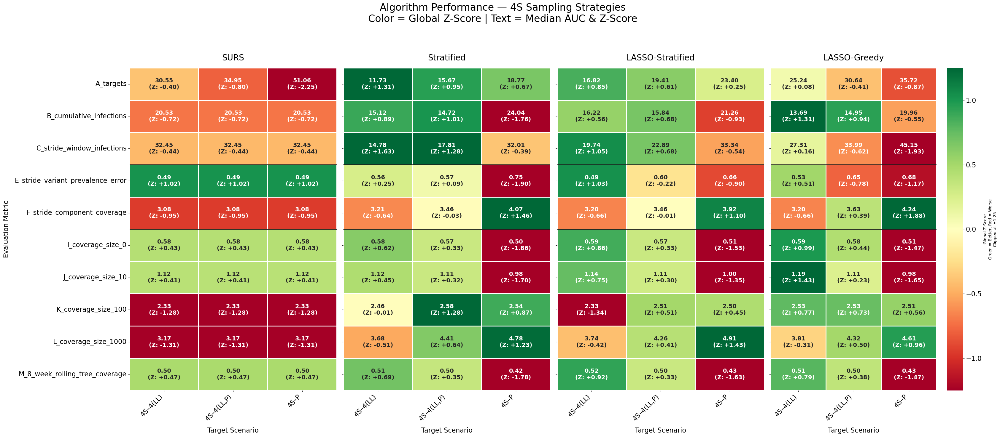

In [9]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
from pathlib import Path

# ==========================================
# 1. Setup and Load Data
# ==========================================
input_file = "./replicate_results/Aggregated_Median_AUC_Rankings.csv"
outdir = Path("./replicate_results")
outdir.mkdir(parents=True, exist_ok=True)

df = pd.read_csv(input_file)
df = df[~df['eval_type'].str.startswith('N_', na=False)].copy()

# ==========================================
# 2. Format Data for Plotting
# ==========================================
# The z_score is already standardized in aggregate_results.py (Positive = Better)
df['annot_str'] = df.apply(lambda row: f"{row['median_auc']:.2f}\n(Z: {row['z_score']:+.2f})", axis=1)

def normalize_label(label):
    return str(label).strip().replace("–", "-") if pd.notna(label) else ""

df['scenario_label_norm'] = df['scenario_label'].apply(normalize_label)
df_1s = df[df['scenario_label_norm'].str.startswith("1S-")].copy()
df_4s = df[df['scenario_label_norm'].str.startswith("4S-")].copy()

desired_order = ["SURS", "Stratified", "LASSO-Stratified", "LASSO-Greedy"]

# ==========================================
# 3. Plotting Function
# ==========================================
def plot_subset_heatmap(df_sub, subset_name, out_filename):
    if df_sub.empty: return
    df_sub = df_sub.sort_values(by=['eval_type', 'scenario_id'])
    
    available_algos = df_sub['algorithm'].unique()
    algorithms = [a for a in desired_order if a in available_algos] + \
                 [a for a in available_algos if a not in desired_order]

    n_algos = len(algorithms)
    fig, axes = plt.subplots(1, n_algos, figsize=(8.5 * n_algos, 14), sharey=True)
    if n_algos == 1: axes = [axes]

    z_clip = 1.25 # Clip color extremes for better contrast
    max_abs_z = min(df_sub['z_score'].abs().max(), z_clip)

    for i, (algo, ax) in enumerate(zip(algorithms, axes)):
        algo_df = df_sub[df_sub['algorithm'] == algo].copy()
        if algo_df.empty:
            ax.axis("off"); continue

        # Pivot matrices
        z_pivot = algo_df.pivot(index='eval_type', columns='scenario_label', values='z_score')
        annot_pivot = algo_df.pivot(index='eval_type', columns='scenario_label', values='annot_str')
        
        # Order columns
        ordered_scenarios = algo_df[['scenario_id', 'scenario_label']].drop_duplicates().sort_values('scenario_id')['scenario_label'].tolist()
        ordered_scenarios = [c for c in ordered_scenarios if c in z_pivot.columns]
        z_pivot = z_pivot[ordered_scenarios]
        annot_pivot = annot_pivot[ordered_scenarios]
        show_cbar = (i == n_algos - 1)

        # Plot
        sns.heatmap(
            z_pivot, annot=annot_pivot, fmt="", cmap="RdYlGn", center=0,
            vmin=-max_abs_z, vmax=max_abs_z, linewidths=1, linecolor='white',
            annot_kws={"size": 14, "weight": "bold"}, cbar=show_cbar,
            cbar_kws={'label': f'Global Z-Score\nGreen = Better, Red = Worse\nClipped at ±{max_abs_z:.2f}'} if show_cbar else None,
            ax=ax
        )

        # Add visual separators
        break_after_prefixes = {'C', 'F'}
        row_labels = z_pivot.index.tolist()
        for j, label in enumerate(row_labels[:-1]):
            if str(label).split('_')[0] in break_after_prefixes:
                ax.hlines(j + 1, *ax.get_xlim(), colors='black', linewidth=2)

        ax.set_title(f"{algo}", fontsize=20, pad=18)
        ax.set_xlabel("Target Scenario", fontsize=16, labelpad=12)
        ax.set_ylabel("Evaluation Metric" if i == 0 else "", fontsize=16, labelpad=12)
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
        ax.tick_params(axis='both', labelsize=16)
        if show_cbar: ax.collections[0].colorbar.ax.tick_params(labelsize=16)

    fig.suptitle(f"Algorithm Performance — {subset_name} Sampling Strategies\nColor = Global Z-Score | Text = Median AUC & Z-Score", fontsize=24, y=1.05)
    plt.tight_layout()
    plt.savefig(outdir / out_filename, dpi=200, bbox_inches="tight")
    print(f"Saved: {outdir / out_filename}")
    plt.show()

# Generate the plots
plot_subset_heatmap(df_1s, "1S", "Heatmap_1S_ZScoreColor.png")
plot_subset_heatmap(df_4s, "4S", "Heatmap_4S_ZScoreColor.png")


Saved Mugration Vertical Heatmap to: replicate_results/Heatmap_Mugration_ZScoreColor.png


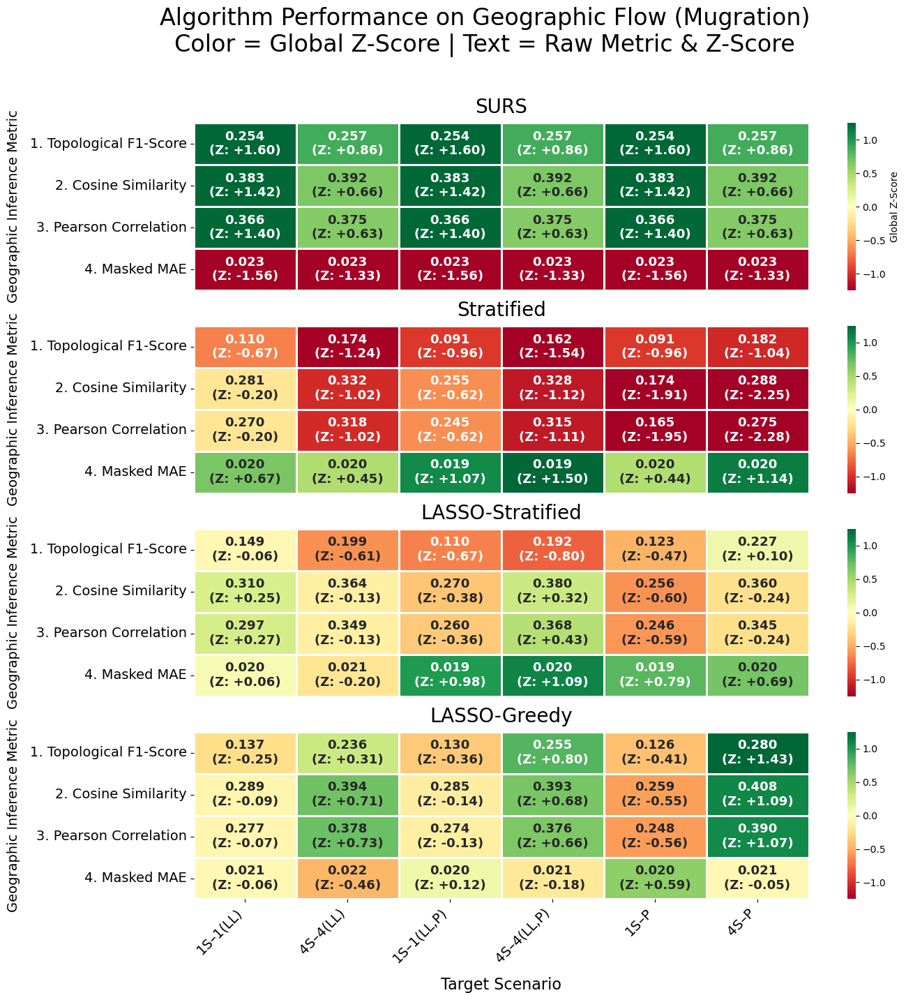

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# ==========================================
# 1. Load the Mugration Data
# ==========================================
input_file = "./replicate_results/Aggregated_Mugration_Metrics.csv"
outdir = Path("./replicate_results")

if not Path(input_file).exists():
    print(f"Error: Could not find '{input_file}'.")
else:
    df_mug = pd.read_csv(input_file)

    # 1. Melt raw scores
    df_raw = df_mug.melt(id_vars=['algorithm', 'scenario_id', 'scenario_label'],
                         value_vars=['median_f1', 'median_cosine', 'median_pearson', 'median_masked_mae'],
                         var_name='metric', value_name='raw_score')
    df_raw['eval_type'] = df_raw['metric'].str.replace('median_', '')

    # 2. Melt Z-scores
    df_z = df_mug.melt(id_vars=['algorithm', 'scenario_id', 'scenario_label'],
                       value_vars=['z_score_f1', 'z_score_cosine', 'z_score_pearson', 'z_score_masked_mae'],
                       var_name='z_metric', value_name='z_score')
    df_z['eval_type'] = df_z['z_metric'].str.replace('z_score_', '')

    # 3. Merge them together so we have raw values (for text) and z_scores (for color)
    df_merged = pd.merge(df_raw, df_z[['algorithm', 'scenario_id', 'eval_type', 'z_score']], 
                         on=['algorithm', 'scenario_id', 'eval_type'])

    # Create the unified annotation string
    df_merged['annot_str'] = df_merged.apply(lambda row: f"{row['raw_score']:.3f}\n(Z: {row['z_score']:+.2f})", axis=1)

    # Clean up names for the plot
    metric_name_map = {
        'f1': '1. Topological F1-Score',
        'cosine': '2. Cosine Similarity',
        'pearson': '3. Pearson Correlation',
        'masked_mae': '4. Masked MAE'
    }
    df_merged['eval_type'] = df_merged['eval_type'].map(metric_name_map)
    df_merged = df_merged.sort_values(by=['eval_type', 'scenario_id'])

    # ==========================================
    # 2. Setup Figure (Vertical Orientation)
    # ==========================================
    desired_order = ["SURS", "Stratified", "LASSO-Stratified", "LASSO-Greedy"]
    available_algos = df_merged['algorithm'].unique()
    algorithms = [a for a in desired_order if a in available_algos] + [a for a in available_algos if a not in desired_order]
    
    n_algos = len(algorithms)
    
    # Create N rows, 1 column. Adjust height based on number of algorithms.
    fig, axes = plt.subplots(n_algos, 1, figsize=(14, 3.5 * n_algos), sharex=True)
    if n_algos == 1: axes = [axes]

    z_clip = 1.25
    max_abs_z = min(df_merged['z_score'].abs().max(), z_clip)

    # ==========================================
    # 3. Plotting Loop
    # ==========================================
    for i, (algo, ax) in enumerate(zip(algorithms, axes)):
        algo_df = df_merged[df_merged['algorithm'] == algo]
        
        z_pivot = algo_df.pivot(index='eval_type', columns='scenario_label', values='z_score')
        annot_pivot = algo_df.pivot(index='eval_type', columns='scenario_label', values='annot_str')
        
        ordered_scenarios = algo_df[['scenario_id', 'scenario_label']].drop_duplicates().sort_values('scenario_id')['scenario_label']
        z_pivot = z_pivot[ordered_scenarios]
        annot_pivot = annot_pivot[ordered_scenarios]

        # Draw Heatmap (Cbar on every row keeps the heatmap widths perfectly aligned)
        sns.heatmap(
            z_pivot, annot=annot_pivot, fmt="", cmap="RdYlGn", center=0,
            vmin=-max_abs_z, vmax=max_abs_z, linewidths=1, linecolor='white',
            annot_kws={"size": 13, "weight": "bold"}, 
            cbar=True,
            cbar_kws={'label': f'Global Z-Score'} if i == 0 else None, # Label only the top colorbar to reduce clutter
            ax=ax
        )

        # Title for each subplot
        ax.set_title(f"{algo}", fontsize=20, pad=10)
        
        # Y-axis label on EVERY row
        ax.set_ylabel("Geographic Inference Metric", fontsize=14, labelpad=10)
        ax.tick_params(axis='y', labelsize=14)

        # --- X-AXIS LOGIC: Bottom Row Only ---
        if i == n_algos - 1:
            ax.set_xlabel("Target Scenario", fontsize=16, labelpad=12)
            ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
            ax.tick_params(axis='x', labelsize=14)
        else:
            # Hide X-labels and ticks for all upper rows
            ax.set_xlabel("")
            ax.set_xticklabels([])
            ax.tick_params(axis='x', bottom=False)

    fig.suptitle("Algorithm Performance on Geographic Flow (Mugration)\nColor = Global Z-Score | Text = Raw Metric & Z-Score", fontsize=24, y=1.02)
    
    plt.tight_layout()
    out_file = outdir / "Heatmap_Mugration_ZScoreColor.png"
    plt.savefig(out_file, dpi=200, bbox_inches="tight")
    print(f"\nSaved Mugration Vertical Heatmap to: {out_file}")
    plt.show()


Saved: replicate_results/Summary_Trajectory_by_Metric.png


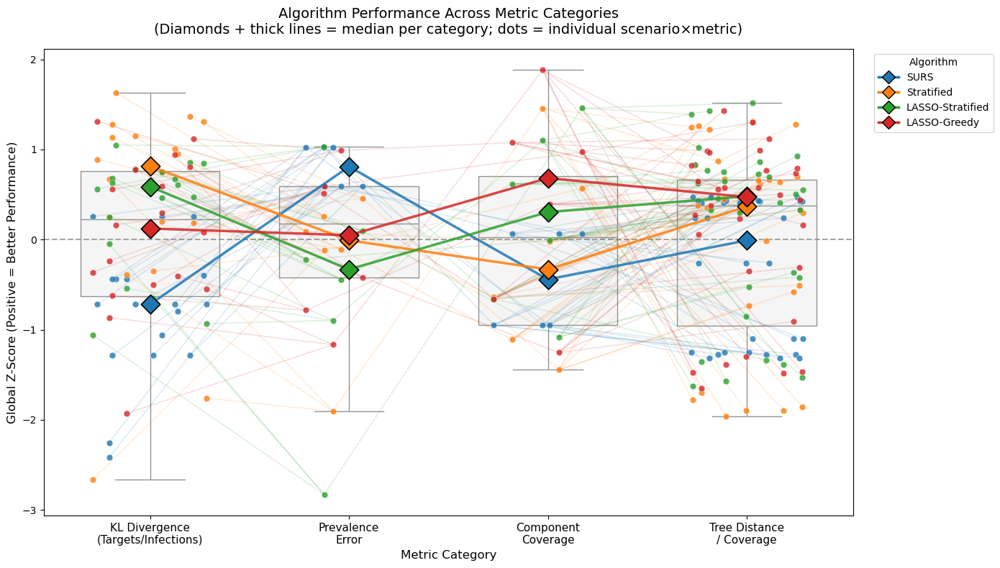

In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import seaborn as sns
from pathlib import Path

input_file = "./replicate_results/Aggregated_Median_AUC_Rankings.csv"
df = pd.read_csv(input_file)

def assign_category(eval_type):
    if eval_type.startswith(('A_', 'B_', 'C_')): return "KL Divergence\n(Targets/Infections)"
    elif eval_type.startswith(('E_')): return "Prevalence\nError"
    elif eval_type.startswith(('F_')): return "Component\nCoverage"
    elif eval_type.startswith(('I_', 'J_', 'K_', 'L_', 'M_')): return "Tree Distance\n/ Coverage"
    else: return "Other"

df['metric_category'] = df['eval_type'].apply(assign_category)
df['task_id'] = df['eval_type'] + "_" + df['scenario_label']

cat_order = ["KL Divergence\n(Targets/Infections)", "Prevalence\nError", "Component\nCoverage", "Tree Distance\n/ Coverage"]
cat_order = [c for c in cat_order if c in df['metric_category'].unique()]

cat_to_x = {cat: i for i, cat in enumerate(cat_order)}
df['x_base'] = df['metric_category'].map(cat_to_x)

# Setup Aesthetics
desired_order = ["SURS", "Stratified", "LASSO-Stratified", "LASSO-Greedy"]
algo_order = [a for a in desired_order if a in df['algorithm'].unique()] + \
             [a for a in df['algorithm'].unique() if a not in desired_order]

cmap = plt.get_cmap('tab10')
algo_colors = {algo: cmap(i) for i, algo in enumerate(algo_order)}

np.random.seed(42)
jitter_map = {task: np.random.uniform(-0.3, 0.3) for task in df['task_id'].unique()}
df['x_jittered'] = df['x_base'] + df['task_id'].map(jitter_map)

fig, ax = plt.subplots(figsize=(14, 8))

# Background boxplots
sns.boxplot(data=df, x='metric_category', y='z_score', order=cat_order, color='whitesmoke', width=0.7, showfliers=False, zorder=1, ax=ax)
ax.axhline(0, color='grey', linestyle='--', linewidth=1.5, alpha=0.7, zorder=2)

for algo in algo_order:
    algo_df = df[df['algorithm'] == algo]
    color = algo_colors[algo]

    for scen, scen_group in algo_df.groupby('scenario_label'):
        # Iterate through adjacent pairs of categories (e.g., Col 1 to Col 2, Col 2 to Col 3)
        for i in range(len(cat_order) - 1):
            cat_curr = cat_order[i]
            cat_next = cat_order[i+1]
            
            # Get all dots for this scenario in the current column, and the next column
            pts_curr = scen_group[scen_group['metric_category'] == cat_curr]
            pts_next = scen_group[scen_group['metric_category'] == cat_next]
            
            # Draw a line from EVERY dot in the current category to EVERY dot in the next category
            # for this specific algorithm + scenario combination.
            if not pts_curr.empty and not pts_next.empty:
                for _, p1 in pts_curr.iterrows():
                    for _, p2 in pts_next.iterrows():
                        ax.plot(
                            [p1['x_jittered'], p2['x_jittered']], 
                            [p1['z_score'], p2['z_score']],
                            color=color, alpha=0.15, linewidth=1.2, zorder=3
                        )

    # Draw dots for ALL individual points of this algorithm
    ax.scatter(
        algo_df['x_jittered'], algo_df['z_score'],
        color=color, edgecolor='white', linewidth=0.4,
        s=40, alpha=0.8, zorder=4
    )


    # Overlay Medians
    medians = algo_df.groupby('metric_category')['z_score'].median()
    for cat in cat_order:
        if cat in medians.index:
            ax.scatter(cat_to_x[cat], medians[cat], color=color, edgecolor='black', linewidth=1.2, s=180, zorder=6, marker='D')

    xs = [cat_to_x[c] for c in cat_order if c in medians.index]
    ys = [medians[c] for c in cat_order if c in medians.index]
    if len(xs) >= 2:
        ax.plot(xs, ys, color=color, linewidth=2.5, alpha=0.85, zorder=5)

# Formatting
ax.set_xticks(range(len(cat_order)))
ax.set_xticklabels(cat_order, fontsize=11)
ax.set_ylabel("Global Z-Score (Positive = Better Performance)", fontsize=12)
ax.set_xlabel("Metric Category", fontsize=12)
ax.set_title("Algorithm Performance Across Metric Categories\n(Diamonds + thick lines = median per category; dots = individual scenario×metric)", fontsize=14, pad=15)

legend_handles = [mlines.Line2D([], [], color=algo_colors[a], marker='D', markersize=9, markeredgecolor='black', linestyle='-', linewidth=2.5, label=a) for a in algo_order]
ax.legend(handles=legend_handles, title="Algorithm", bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=10)

plt.tight_layout()
out_file = Path("replicate_results/Summary_Trajectory_by_Metric.png")
plt.savefig(out_file, dpi=200, bbox_inches='tight')
print(f"\nSaved: {out_file}")
plt.show()

In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# ==========================================
# 1. Configuration
# ==========================================
# Point this to the directory containing your replicate_0, replicate_1, etc.
def get_data(base_dir):
    print(f"Scanning for replicate data in {base_dir}...")

    # ==========================================
    # 2. Load and Concatenate Individual Replicate Files
    # ==========================================
    auc_files = list(base_dir.glob("replicate_*/AUC_rankings.csv"))
    mug_files = list(base_dir.glob("replicate_*/Mugration_Metrics.csv"))

    if not auc_files or not mug_files:
        print("Error: Could not find AUC or Mugration files. Check your path.")
    else:
        # Load AUC Data
        df_auc_list = []
        for f in auc_files:
            df = pd.read_csv(f)
            df['replicate'] = f.parent.name
            df_auc_list.append(df)
        df_auc_full = pd.concat(df_auc_list, ignore_index=True)
        
        # Load Mugration Data
        df_mug_list = []
        for f in mug_files:
            df = pd.read_csv(f)
            df['replicate'] = f.parent.name
            df_mug_list.append(df)
        df_mug_full = pd.concat(df_mug_list, ignore_index=True)

        # ==========================================
        # 3. Pivot the Graph Metrics
        # ==========================================
        # We only care about the graph coverage metrics (F, I, J, K, L, M)
        graph_prefixes = ('F_', 'I_', 'J_', 'K_', 'L_', 'M_')
        df_graph_only = df_auc_full[df_auc_full['eval_type'].str.startswith(graph_prefixes)].copy()
        
        # Pivot so each metric becomes a column
        df_graph_pivot = df_graph_only.pivot_table(
            index=['replicate', 'algorithm', 'scenario_id', 'scenario_label'],
            columns='eval_type',
            values='auc'
        ).reset_index()

        # ==========================================
        # 4. Merge Graph Metrics with Mugration Metrics
        # ==========================================
        # Inner join ensures we only look at runs where BOTH succeeded
        df_merged = pd.merge(
            df_graph_pivot, 
            df_mug_full, 
            on=['replicate', 'algorithm', 'scenario_id', 'scenario_label'], 
            how='inner'
        )
        
        print(f"Successfully merged {len(df_merged)} total simulation runs across all replicates.")
        display(df_merged.head(3))
        return df_merged, df_graph_pivot

In [20]:
# ==========================================
# 5. Calculate and Plot Correlation Matrix
# ==========================================
# Define the columns we want to correlate
def graph_mugration_heat(df_graph_pivot, df_merged, graph_prefixes):
    mugration_cols = ['topological_f1', 'cosine_similarity', 'pearson_r', 'masked_mae']
    graph_cols = [c for c in df_graph_pivot.columns if c.startswith(graph_prefixes)]

    # Calculate Spearman correlation (better for non-linear relationships than Pearson)
    corr_matrix = df_merged[graph_cols + mugration_cols].corr(method='spearman')

    # Subset the matrix to only show Graph Metrics (rows) vs Mugration Metrics (cols)
    target_corr = corr_matrix.loc[graph_cols, mugration_cols]

    # Plotting
    plt.figure(figsize=(10, 8))
    sns.heatmap(
        target_corr, 
        annot=True, 
        fmt=".2f", 
        cmap="coolwarm", 
        center=0,
        vmin=-1, vmax=1,
        cbar_kws={'label': 'Spearman Correlation\n(1.0 = Perfect Positive, -1.0 = Perfect Negative)'}
    )

    plt.title("Correlation: Graph Coverage Metrics vs. Mugration Performance\nAcross All Replicates", fontsize=16, pad=20)
    plt.xlabel("Mugration (Geographic) Metrics", fontsize=14)
    plt.ylabel("Graph Coverage (Topological) Metrics", fontsize=14)
    plt.xticks(rotation=45, ha='right')

    plt.tight_layout()
    plt.savefig(base_dir / "Correlation_Graph_vs_Mugration.png", dpi=200)
    plt.show()

In [17]:
target_corr

,topological_f1,cosine_similarity,pearson_r,masked_mae
F_stride_component_coverage,-0.366853,-0.252266,-0.244874,-0.227189
I_coverage_size_0,-0.402230,-0.203707,-0.194858,-0.119188
J_coverage_size_10,-0.415171,-0.207399,-0.198183,-0.121658
K_coverage_size_100,-0.520260,-0.372057,-0.362104,-0.279365
L_coverage_size_1000,-0.370467,-0.405999,-0.400513,-0.318207
M_8_week_rolling_tree_coverage,-0.407524,-0.201886,-0.192771,-0.120885


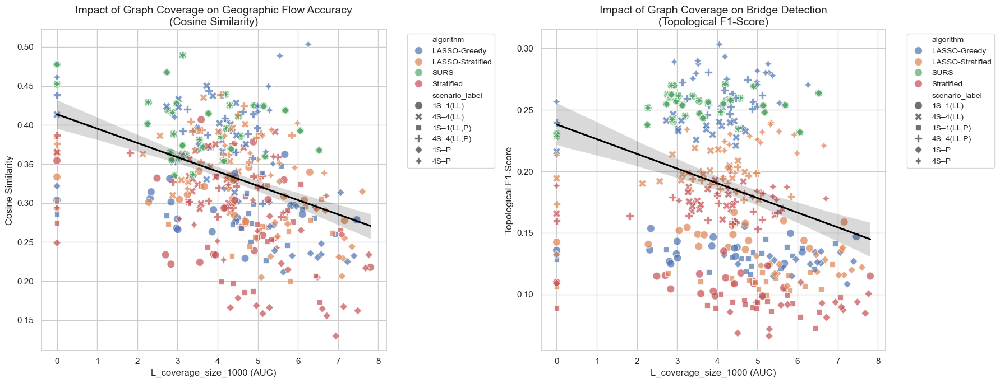

In [18]:
# ==========================================
# 6. Scatter Plots of Key Relationships
# ==========================================
# Let's pick the "Holy Grail" metrics to plot against each other
# You can change these strings to match the specific column names from the heatmap above
x_metric = 'L_coverage_size_1000'     # Large Tree Coverage AUC
y_metric_1 = 'cosine_similarity'      # Flow accuracy
y_metric_2 = 'topological_f1'         # Bridge detection

sns.set_theme(style="whitegrid")
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Plot 1: Graph Coverage vs Cosine Similarity
sns.scatterplot(
    data=df_merged, x=x_metric, y=y_metric_1, 
    hue='algorithm', style='scenario_label', 
    s=100, alpha=0.7, ax=axes[0]
)
# Add a linear regression line to show the overall trend
sns.regplot(data=df_merged, x=x_metric, y=y_metric_1, scatter=False, color='black', ax=axes[0])

axes[0].set_title(f"Impact of Graph Coverage on Geographic Flow Accuracy\n(Cosine Similarity)", fontsize=14)
axes[0].set_xlabel(f"{x_metric} (AUC)", fontsize=12)
axes[0].set_ylabel("Cosine Similarity", fontsize=12)

# Plot 2: Graph Coverage vs F1-Score
sns.scatterplot(
    data=df_merged, x=x_metric, y=y_metric_2, 
    hue='algorithm', style='scenario_label', 
    s=100, alpha=0.7, ax=axes[1]
)
sns.regplot(data=df_merged, x=x_metric, y=y_metric_2, scatter=False, color='black', ax=axes[1])

axes[1].set_title(f"Impact of Graph Coverage on Bridge Detection\n(Topological F1-Score)", fontsize=14)
axes[1].set_xlabel(f"{x_metric} (AUC)", fontsize=12)
axes[1].set_ylabel("Topological F1-Score", fontsize=12)

# Cleanup legends
for ax in axes:
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

plt.tight_layout()
plt.savefig(base_dir / "Scatter_Graph_vs_Mugration.png", dpi=200)
plt.show()

In [26]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from scipy.stats import pearsonr
from IPython.display import display

In [40]:
# ==========================================
# 6. Scatter Plots of Key Relationships (Looping over X metrics)
# ==========================================
def graph_mugration_scatter(df_merged):
    # Define all the graph metrics you want to explore on the X-axis, 
    # along with a clean, readable title for the plots.
    x_metrics_to_plot = {
        'F_stride_component_coverage': 'Component Coverage (Ratio of Components Found)',
        'I_coverage_size_0': 'Tree Coverage (All Sizes)',
        'J_coverage_size_10': 'Tree Coverage (> 10 nodes)',
        'K_coverage_size_100': 'Tree Coverage (> 100 nodes)',
        'L_coverage_size_1000': 'Tree Coverage (> 1000 nodes)',
        'M_8_week_rolling_tree_coverage': '8-Week Rolling Tree Coverage'
    }

    y_metric_1 = 'cosine_similarity'
    y_metric_2 = 'topological_f1'

    sns.set_theme(style="whitegrid")

    for x_metric, x_title in x_metrics_to_plot.items():
        if x_metric not in df_merged.columns:
            continue

        # ---------------------------------------------------------
        # PART A: Generate the Plot
        # ---------------------------------------------------------
        fig, axes = plt.subplots(1, 2, figsize=(18, 7))

        # Plot 1: Cosine
        sns.scatterplot(
            data=df_merged, x=x_metric, y=y_metric_1, 
            hue='algorithm', style='scenario_label', 
            s=100, alpha=0.7, ax=axes[0]
        )
        sns.regplot(data=df_merged, x=x_metric, y=y_metric_1, scatter=False, color='black', line_kws={'label': 'Global Trend'}, ax=axes[0])
        axes[0].set_title(f"Impact of {x_title} on Geographic Flow\n(Cosine Similarity)", fontsize=14)
        axes[0].set_xlabel(f"{x_metric} (AUC)", fontsize=12)
        axes[0].set_ylabel("Cosine Similarity", fontsize=12)

        # Plot 2: F1-Score
        sns.scatterplot(
            data=df_merged, x=x_metric, y=y_metric_2, 
            hue='algorithm', style='scenario_label', 
            s=100, alpha=0.7, ax=axes[1]
        )
        sns.regplot(data=df_merged, x=x_metric, y=y_metric_2, scatter=False, color='black', line_kws={'label': 'Global Trend'}, ax=axes[1])
        axes[1].set_title(f"Impact of {x_title} on Bridge Detection\n(Topological F1-Score)", fontsize=14)
        axes[1].set_xlabel(f"{x_metric} (AUC)", fontsize=12)
        axes[1].set_ylabel("Topological F1-Score", fontsize=12)

        for ax in axes:
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

        plt.tight_layout()
        out_path = base_dir / f"Scatter_{x_metric}_vs_Mugration.png"
        plt.savefig(out_path, dpi=200)
        
        # ---------------------------------------------------------
        # PART B: Calculate Within-Group Statistics (Simpson's Check)
        # ---------------------------------------------------------
        stats_list = []
        
        # Group by Algorithm + Scenario
        for (algo, scen), group_df in df_merged.groupby(['algorithm', 'scenario_label']):
            if len(group_df) < 2:
                continue
                
            x_vals = group_df[x_metric]
            y1_vals = group_df[y_metric_1]
            y2_vals = group_df[y_metric_2]
            
            # Calculate for Y1 (Cosine)
            if x_vals.nunique() > 1 and y1_vals.nunique() > 1:
                r1, _ = pearsonr(x_vals, y1_vals)
                r2_1 = r1**2
            else:
                r1, r2_1 = np.nan, np.nan
                
            # Calculate for Y2 (F1)
            if x_vals.nunique() > 1 and y2_vals.nunique() > 1:
                r2, _ = pearsonr(x_vals, y2_vals)
                r2_2 = r2**2
            else:
                r2, r2_2 = np.nan, np.nan
                
            stats_list.append({
                'Algorithm': algo,
                'Scenario': scen,
                'r (Cosine)': r1,
                'R² (Cosine)': r2_1,
                'r (F1)': r2,
                'R² (F1)': r2_2
            })
            #display(group_df[[x_metric, y_metric_1, y_metric_2]])
            #display(group_df)
        stats_df = pd.DataFrame(stats_list)
        
        # Sort nicely for readability
        if not stats_df.empty:
            stats_df = stats_df.sort_values(['Algorithm', 'Scenario']).reset_index(drop=True)
        
        # ---------------------------------------------------------
        # PART C: Display Results
        # ---------------------------------------------------------
        print("=" * 100)
        print(f"ANALYSIS: {x_title}")
        print(f"Saved plot to: {out_path.name}")
        print("=" * 100)
        plt.show()
        
        print(f"--- Within-Group Correlation & R² (Simpson's Paradox Check) ---")
        print("Note: 'r' is Pearson correlation (-1 to 1). 'R²' is variance explained (0 to 1).")
        print("If global line is negative, but 'r' here is positive, Simpson's Paradox is occurring!\n")
        
        # Highlight positive correlations in green and negative in red for easy reading
        #def color_r(val):
        #    if pd.isna(val): return ''
        #    color = 'green' if val > 0 else 'red'
        #    return f'color: {color}'
            
        #display(stats_df.style.applymap(color_r, subset=['r (Cosine)', 'r (F1)']).format("{:.3f}", subset=['r (Cosine)', 'R² (Cosine)', 'r (F1)', 'R² (F1)']))
        print(f"{x_metric} Table")
        display(stats_df.round(3))

        print("\n\n")

In [43]:
import pandas as pd

def print_metric_ranges(df, x_metric='I_coverage_size_0', y_metric='cosine_similarity'):
    """Prints a highly compressed CSV summary of the distribution of X and Y metrics."""
    print(f"--- Summary for X: {x_metric} | Y: {y_metric} ---")
    
    # Filter to just the columns we need
    df_subset = df[['algorithm', 'scenario_label', x_metric, y_metric]].copy()

    # Define a custom aggregation to get the distribution shape
    def get_dist(series):
        return pd.Series({
            'min': series.min(),
            '25%': series.quantile(0.25),
            'med': series.median(),
            '75%': series.quantile(0.75),
            'max': series.max()
        })

    # Group and aggregate
    dist_df = df_subset.groupby(['algorithm', 'scenario_label']).apply(
        lambda g: pd.concat({
            'X_Cov': get_dist(g[x_metric]),
            'Y_Cos': get_dist(g[y_metric])
        })
    ).unstack().round(3)

    # Print as a compact CSV
    print(dist_df.to_csv())
    print("-" * 60)

Scanning for replicate data in replicate_results...
Successfully merged 432 total simulation runs across all replicates.


,replicate,algorithm,scenario_id,scenario_label,F_stride_component_coverage,I_coverage_size_0,J_coverage_size_10,K_coverage_size_100,L_coverage_size_1000,M_8_week_rolling_tree_coverage,pearson_r,masked_mae,cosine_similarity,topological_f1
0,replicate_0,LASSO-Greedy,1,1S–1(LL),3.986496,1.178313,1.830958,3.272484,2.319469,1.153870,0.295008,0.020807,0.305806,0.136160
1,replicate_0,LASSO-Greedy,2,4S–4(LL),3.137562,0.637654,1.208806,2.770053,3.027576,0.551606,0.418942,0.020922,0.433169,0.234617
2,replicate_0,LASSO-Greedy,3,"1S–1(LL,P)",4.159332,1.236470,1.996339,3.714348,4.887798,1.205251,0.288117,0.020510,0.298831,0.134098


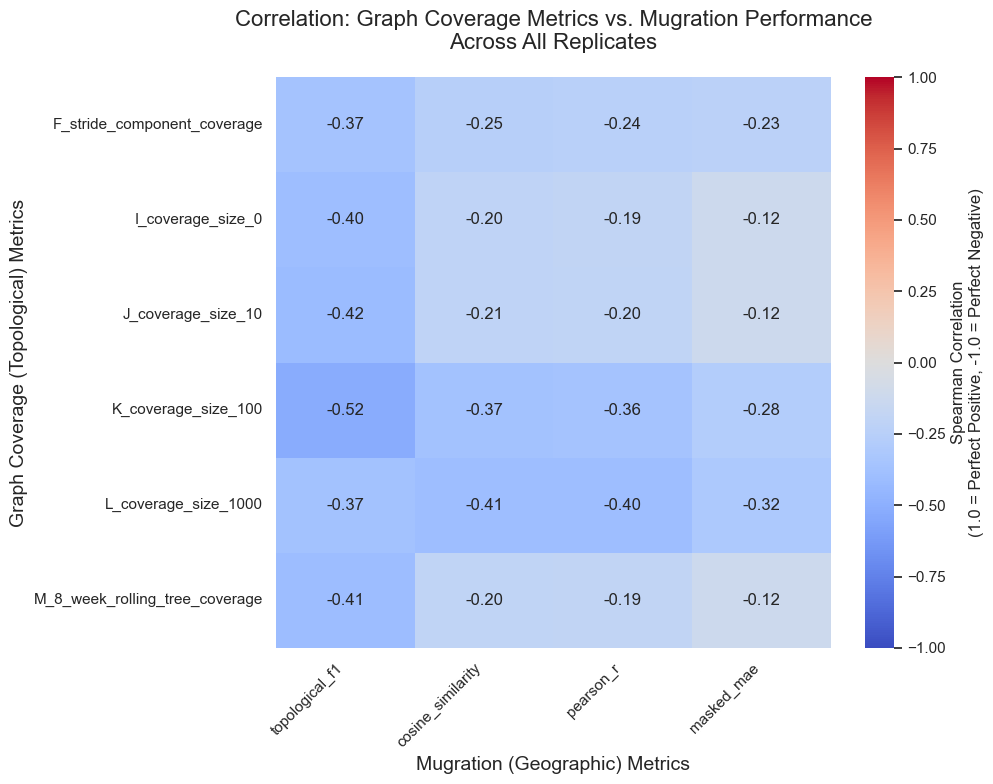

ANALYSIS: Component Coverage (Ratio of Components Found)
Saved plot to: Scatter_F_stride_component_coverage_vs_Mugration.png


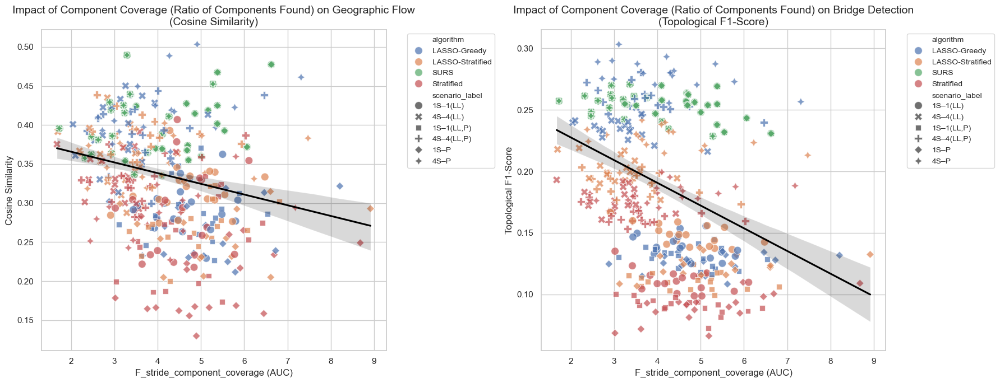

--- Within-Group Correlation & R² (Simpson's Paradox Check) ---
Note: 'r' is Pearson correlation (-1 to 1). 'R²' is variance explained (0 to 1).
If global line is negative, but 'r' here is positive, Simpson's Paradox is occurring!

F_stride_component_coverage Table


,Algorithm,Scenario,r (Cosine),R² (Cosine),r (F1),R² (F1)
0,LASSO-Greedy,1S–1(LL),0.056,0.003,-0.409,0.168
1,LASSO-Greedy,"1S–1(LL,P)",0.037,0.001,-0.277,0.077
2,LASSO-Greedy,1S–P,0.158,0.025,0.247,0.061
3,LASSO-Greedy,4S–4(LL),0.241,0.058,-0.474,0.225
4,LASSO-Greedy,"4S–4(LL,P)",0.160,0.025,-0.423,0.179
5,LASSO-Greedy,4S–P,0.374,0.140,-0.527,0.278
6,LASSO-Stratified,1S–1(LL),0.175,0.030,-0.637,0.405
7,LASSO-Stratified,"1S–1(LL,P)",0.381,0.145,-0.210,0.044
8,LASSO-Stratified,1S–P,0.035,0.001,0.428,0.183
9,LASSO-Stratified,4S–4(LL),-0.194,0.038,-0.488,0.238





ANALYSIS: Tree Coverage (All Sizes)
Saved plot to: Scatter_I_coverage_size_0_vs_Mugration.png


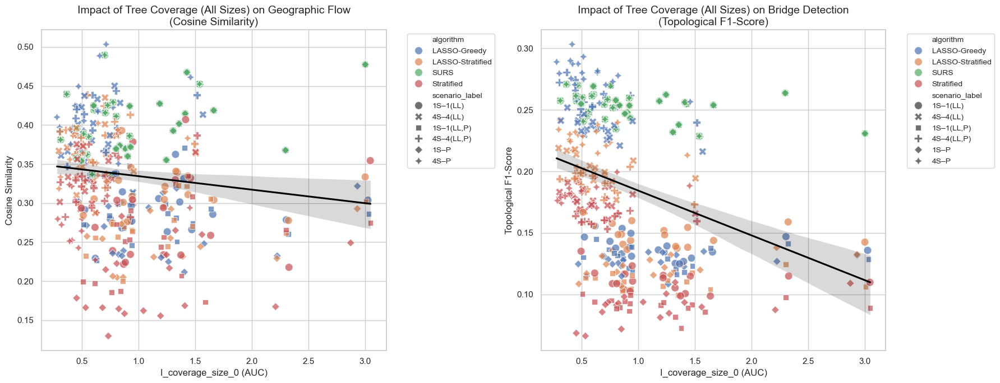

--- Within-Group Correlation & R² (Simpson's Paradox Check) ---
Note: 'r' is Pearson correlation (-1 to 1). 'R²' is variance explained (0 to 1).
If global line is negative, but 'r' here is positive, Simpson's Paradox is occurring!

I_coverage_size_0 Table


,Algorithm,Scenario,r (Cosine),R² (Cosine),r (F1),R² (F1)
0,LASSO-Greedy,1S–1(LL),0.132,0.017,-0.276,0.076
1,LASSO-Greedy,"1S–1(LL,P)",-0.022,0.000,-0.049,0.002
2,LASSO-Greedy,1S–P,0.086,0.007,0.290,0.084
3,LASSO-Greedy,4S–4(LL),0.100,0.010,-0.690,0.476
4,LASSO-Greedy,"4S–4(LL,P)",0.167,0.028,-0.524,0.274
5,LASSO-Greedy,4S–P,0.377,0.142,-0.626,0.392
6,LASSO-Stratified,1S–1(LL),0.056,0.003,-0.230,0.053
7,LASSO-Stratified,"1S–1(LL,P)",0.451,0.203,0.059,0.004
8,LASSO-Stratified,1S–P,0.037,0.001,0.481,0.231
9,LASSO-Stratified,4S–4(LL),0.072,0.005,-0.463,0.215





ANALYSIS: Tree Coverage (> 10 nodes)
Saved plot to: Scatter_J_coverage_size_10_vs_Mugration.png


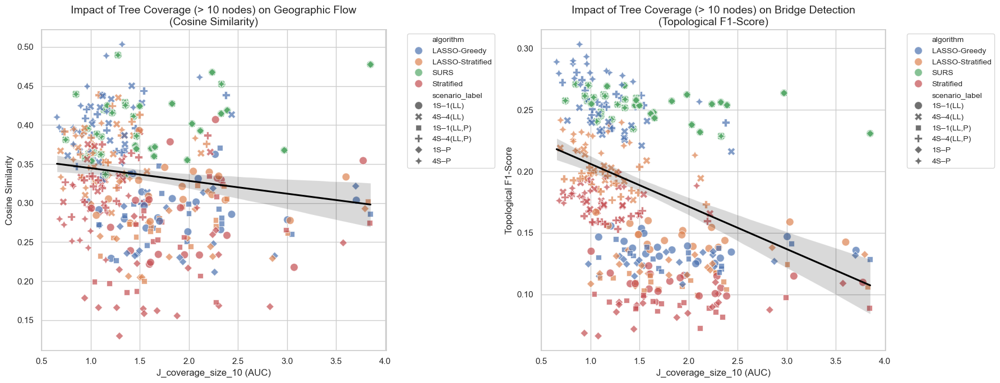

--- Within-Group Correlation & R² (Simpson's Paradox Check) ---
Note: 'r' is Pearson correlation (-1 to 1). 'R²' is variance explained (0 to 1).
If global line is negative, but 'r' here is positive, Simpson's Paradox is occurring!

J_coverage_size_10 Table


,Algorithm,Scenario,r (Cosine),R² (Cosine),r (F1),R² (F1)
0,LASSO-Greedy,1S–1(LL),0.160,0.026,-0.360,0.130
1,LASSO-Greedy,"1S–1(LL,P)",0.036,0.001,-0.141,0.020
2,LASSO-Greedy,1S–P,0.121,0.015,0.328,0.108
3,LASSO-Greedy,4S–4(LL),0.133,0.018,-0.717,0.514
4,LASSO-Greedy,"4S–4(LL,P)",0.206,0.042,-0.526,0.277
5,LASSO-Greedy,4S–P,0.421,0.177,-0.626,0.392
6,LASSO-Stratified,1S–1(LL),0.092,0.009,-0.308,0.095
7,LASSO-Stratified,"1S–1(LL,P)",0.495,0.245,0.046,0.002
8,LASSO-Stratified,1S–P,0.065,0.004,0.470,0.220
9,LASSO-Stratified,4S–4(LL),0.060,0.004,-0.499,0.249





ANALYSIS: Tree Coverage (> 100 nodes)
Saved plot to: Scatter_K_coverage_size_100_vs_Mugration.png


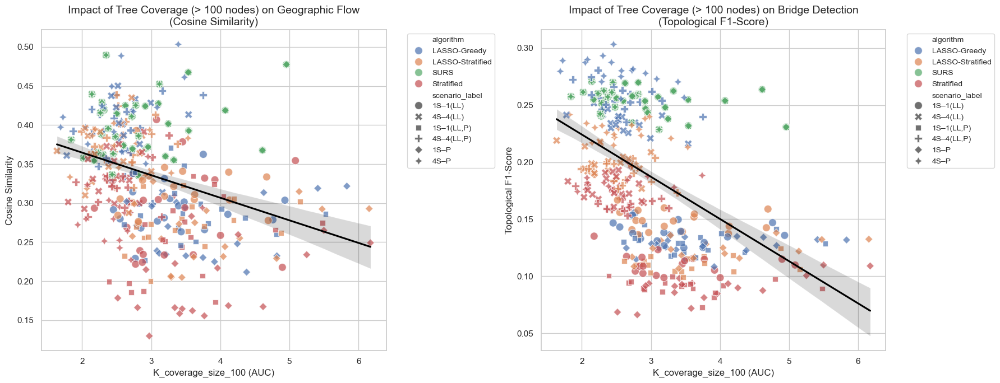

--- Within-Group Correlation & R² (Simpson's Paradox Check) ---
Note: 'r' is Pearson correlation (-1 to 1). 'R²' is variance explained (0 to 1).
If global line is negative, but 'r' here is positive, Simpson's Paradox is occurring!

K_coverage_size_100 Table


,Algorithm,Scenario,r (Cosine),R² (Cosine),r (F1),R² (F1)
0,LASSO-Greedy,1S–1(LL),0.071,0.005,-0.257,0.066
1,LASSO-Greedy,"1S–1(LL,P)",-0.133,0.018,-0.072,0.005
2,LASSO-Greedy,1S–P,0.231,0.053,0.347,0.120
3,LASSO-Greedy,4S–4(LL),0.090,0.008,-0.649,0.421
4,LASSO-Greedy,"4S–4(LL,P)",0.140,0.020,-0.529,0.280
5,LASSO-Greedy,4S–P,0.449,0.202,-0.529,0.280
6,LASSO-Stratified,1S–1(LL),0.016,0.000,-0.162,0.026
7,LASSO-Stratified,"1S–1(LL,P)",0.315,0.099,0.163,0.027
8,LASSO-Stratified,1S–P,0.237,0.056,0.460,0.212
9,LASSO-Stratified,4S–4(LL),0.027,0.001,-0.350,0.123





ANALYSIS: Tree Coverage (> 1000 nodes)
Saved plot to: Scatter_L_coverage_size_1000_vs_Mugration.png


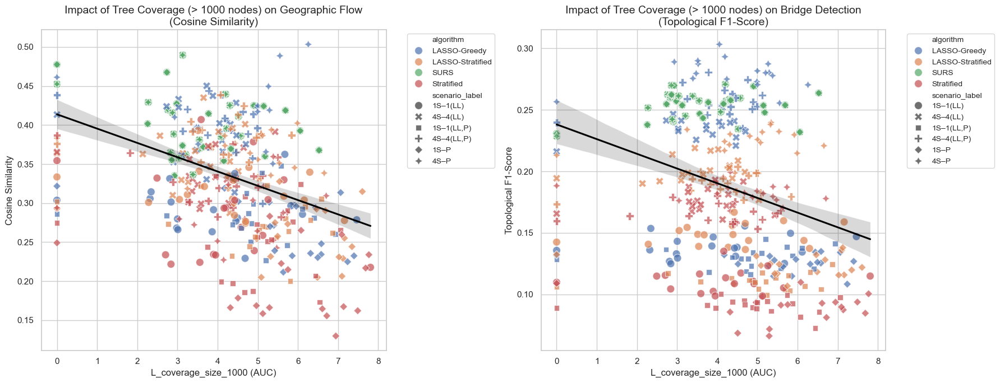

--- Within-Group Correlation & R² (Simpson's Paradox Check) ---
Note: 'r' is Pearson correlation (-1 to 1). 'R²' is variance explained (0 to 1).
If global line is negative, but 'r' here is positive, Simpson's Paradox is occurring!

L_coverage_size_1000 Table


,Algorithm,Scenario,r (Cosine),R² (Cosine),r (F1),R² (F1)
0,LASSO-Greedy,1S–1(LL),-0.072,0.005,0.197,0.039
1,LASSO-Greedy,"1S–1(LL,P)",-0.118,0.014,0.160,0.026
2,LASSO-Greedy,1S–P,-0.543,0.295,-0.201,0.040
3,LASSO-Greedy,4S–4(LL),-0.214,0.046,0.318,0.101
4,LASSO-Greedy,"4S–4(LL,P)",-0.435,0.189,0.203,0.041
5,LASSO-Greedy,4S–P,0.103,0.011,0.061,0.004
6,LASSO-Stratified,1S–1(LL),-0.272,0.074,0.209,0.044
7,LASSO-Stratified,"1S–1(LL,P)",-0.212,0.045,0.109,0.012
8,LASSO-Stratified,1S–P,-0.249,0.062,-0.074,0.005
9,LASSO-Stratified,4S–4(LL),0.103,0.011,0.108,0.012





ANALYSIS: 8-Week Rolling Tree Coverage
Saved plot to: Scatter_M_8_week_rolling_tree_coverage_vs_Mugration.png


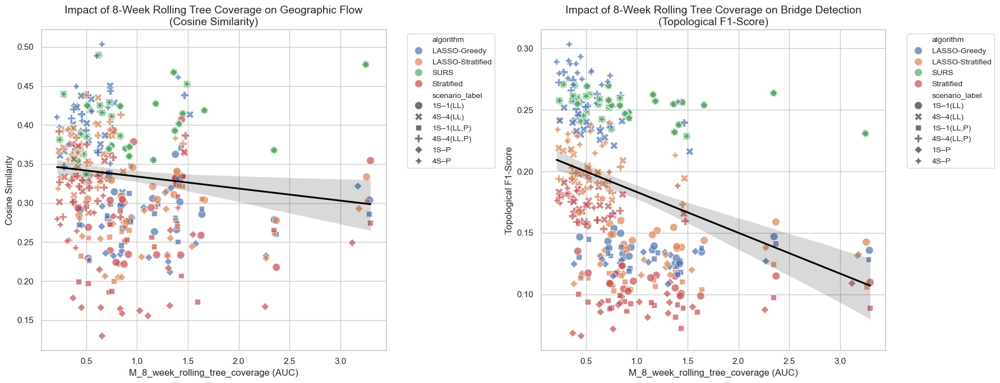

--- Within-Group Correlation & R² (Simpson's Paradox Check) ---
Note: 'r' is Pearson correlation (-1 to 1). 'R²' is variance explained (0 to 1).
If global line is negative, but 'r' here is positive, Simpson's Paradox is occurring!

M_8_week_rolling_tree_coverage Table


,Algorithm,Scenario,r (Cosine),R² (Cosine),r (F1),R² (F1)
0,LASSO-Greedy,1S–1(LL),0.153,0.023,-0.302,0.091
1,LASSO-Greedy,"1S–1(LL,P)",-0.005,0.000,-0.082,0.007
2,LASSO-Greedy,1S–P,0.122,0.015,0.295,0.087
3,LASSO-Greedy,4S–4(LL),0.117,0.014,-0.703,0.494
4,LASSO-Greedy,"4S–4(LL,P)",0.187,0.035,-0.542,0.294
5,LASSO-Greedy,4S–P,0.401,0.161,-0.641,0.410
6,LASSO-Stratified,1S–1(LL),0.065,0.004,-0.271,0.073
7,LASSO-Stratified,"1S–1(LL,P)",0.481,0.231,0.029,0.001
8,LASSO-Stratified,1S–P,0.056,0.003,0.476,0.226
9,LASSO-Stratified,4S–4(LL),0.074,0.006,-0.485,0.235


In [33]:
df_merged, df_graph_pivot = get_data(Path("./replicate_results"))
graph_mugration_heat(df_graph_pivot, df_merged, graph_prefixes=('F_', 'I_', 'J_', 'K_', 'L_', 'M_'))
graph_mugration_scatter(df_merged)

Scanning for replicate data in lasso_greedy50...
Successfully merged 432 total simulation runs across all replicates.


,replicate,algorithm,scenario_id,scenario_label,F_stride_component_coverage,I_coverage_size_0,J_coverage_size_10,K_coverage_size_100,L_coverage_size_1000,M_8_week_rolling_tree_coverage,pearson_r,masked_mae,cosine_similarity,topological_f1
0,replicate_0,LASSO-Greedy,1,1S–1(LL),4.701006,1.167109,1.824270,3.433611,4.587583,1.144061,0.425291,0.022328,0.441349,0.250987
1,replicate_0,LASSO-Greedy,2,4S–4(LL),2.716837,0.616084,1.149670,2.384451,1.410828,0.539371,0.357836,0.023850,0.374079,0.228538
2,replicate_0,LASSO-Greedy,3,"1S–1(LL,P)",5.022275,1.223925,1.986821,3.585239,3.834624,1.182979,0.458983,0.021807,0.474073,0.248141


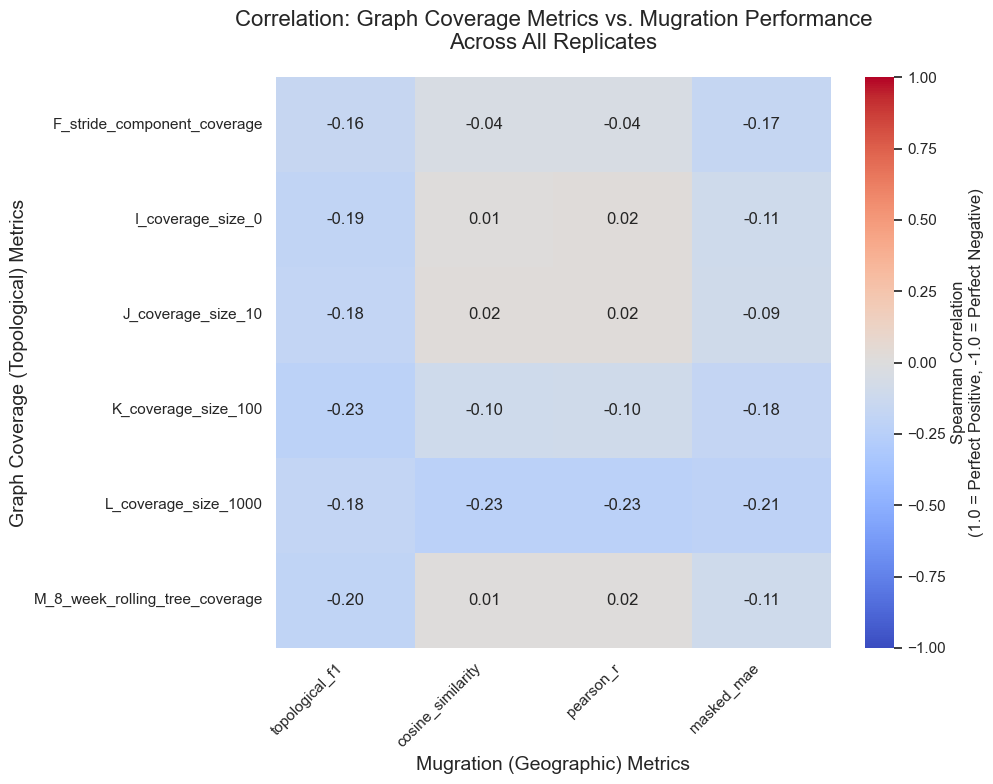

ANALYSIS: Component Coverage (Ratio of Components Found)
Saved plot to: Scatter_F_stride_component_coverage_vs_Mugration.png


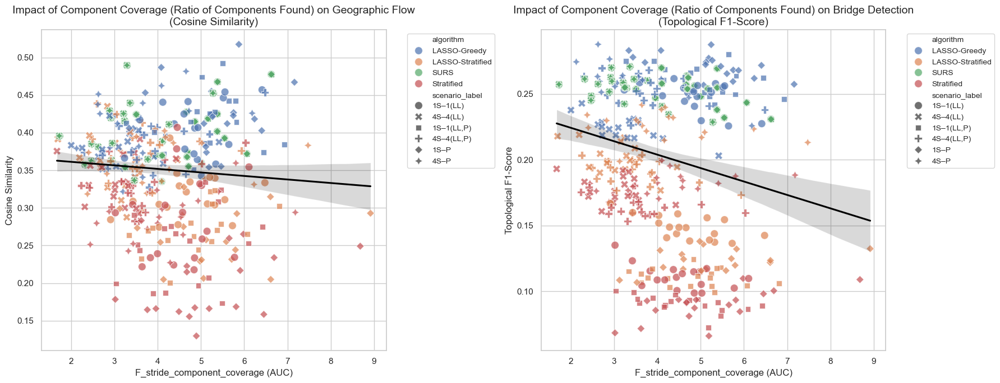

--- Within-Group Correlation & R² (Simpson's Paradox Check) ---
Note: 'r' is Pearson correlation (-1 to 1). 'R²' is variance explained (0 to 1).
If global line is negative, but 'r' here is positive, Simpson's Paradox is occurring!

F_stride_component_coverage Table


,Algorithm,Scenario,r (Cosine),R² (Cosine),r (F1),R² (F1)
0,LASSO-Greedy,1S–1(LL),0.247,0.061,-0.471,0.221
1,LASSO-Greedy,"1S–1(LL,P)",0.085,0.007,-0.462,0.214
2,LASSO-Greedy,1S–P,0.078,0.006,-0.632,0.400
3,LASSO-Greedy,4S–4(LL),0.054,0.003,-0.747,0.558
4,LASSO-Greedy,"4S–4(LL,P)",0.482,0.232,-0.325,0.106
5,LASSO-Greedy,4S–P,0.309,0.096,-0.763,0.582
6,LASSO-Stratified,1S–1(LL),0.175,0.030,-0.637,0.405
7,LASSO-Stratified,"1S–1(LL,P)",0.381,0.145,-0.210,0.044
8,LASSO-Stratified,1S–P,0.035,0.001,0.428,0.183
9,LASSO-Stratified,4S–4(LL),-0.194,0.038,-0.488,0.238





ANALYSIS: Tree Coverage (All Sizes)
Saved plot to: Scatter_I_coverage_size_0_vs_Mugration.png


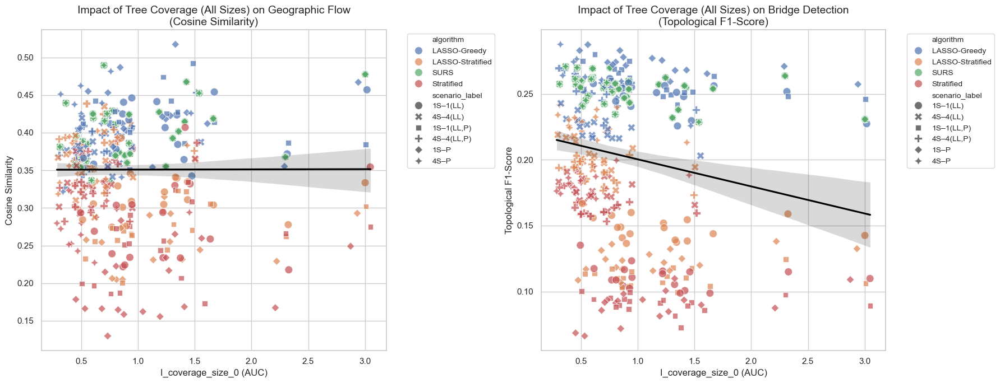

--- Within-Group Correlation & R² (Simpson's Paradox Check) ---
Note: 'r' is Pearson correlation (-1 to 1). 'R²' is variance explained (0 to 1).
If global line is negative, but 'r' here is positive, Simpson's Paradox is occurring!

I_coverage_size_0 Table


,Algorithm,Scenario,r (Cosine),R² (Cosine),r (F1),R² (F1)
0,LASSO-Greedy,1S–1(LL),0.219,0.048,-0.494,0.244
1,LASSO-Greedy,"1S–1(LL,P)",-0.067,0.004,-0.654,0.427
2,LASSO-Greedy,1S–P,0.051,0.003,-0.573,0.328
3,LASSO-Greedy,4S–4(LL),-0.036,0.001,-0.768,0.589
4,LASSO-Greedy,"4S–4(LL,P)",0.777,0.604,-0.508,0.258
5,LASSO-Greedy,4S–P,0.187,0.035,-0.841,0.707
6,LASSO-Stratified,1S–1(LL),0.056,0.003,-0.230,0.053
7,LASSO-Stratified,"1S–1(LL,P)",0.451,0.203,0.059,0.004
8,LASSO-Stratified,1S–P,0.037,0.001,0.481,0.231
9,LASSO-Stratified,4S–4(LL),0.072,0.005,-0.463,0.215





ANALYSIS: Tree Coverage (> 10 nodes)
Saved plot to: Scatter_J_coverage_size_10_vs_Mugration.png


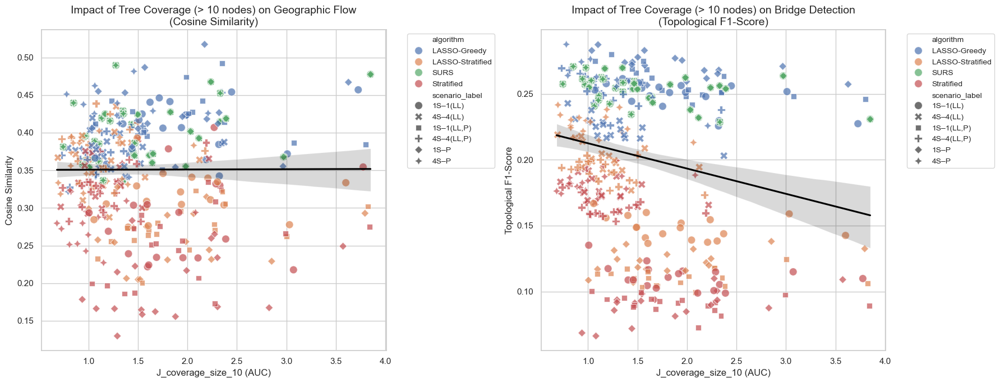

--- Within-Group Correlation & R² (Simpson's Paradox Check) ---
Note: 'r' is Pearson correlation (-1 to 1). 'R²' is variance explained (0 to 1).
If global line is negative, but 'r' here is positive, Simpson's Paradox is occurring!

J_coverage_size_10 Table


,Algorithm,Scenario,r (Cosine),R² (Cosine),r (F1),R² (F1)
0,LASSO-Greedy,1S–1(LL),0.203,0.041,-0.572,0.328
1,LASSO-Greedy,"1S–1(LL,P)",-0.053,0.003,-0.709,0.503
2,LASSO-Greedy,1S–P,0.077,0.006,-0.624,0.389
3,LASSO-Greedy,4S–4(LL),-0.070,0.005,-0.799,0.638
4,LASSO-Greedy,"4S–4(LL,P)",0.766,0.587,-0.518,0.269
5,LASSO-Greedy,4S–P,0.260,0.067,-0.853,0.728
6,LASSO-Stratified,1S–1(LL),0.092,0.009,-0.308,0.095
7,LASSO-Stratified,"1S–1(LL,P)",0.495,0.245,0.046,0.002
8,LASSO-Stratified,1S–P,0.065,0.004,0.470,0.220
9,LASSO-Stratified,4S–4(LL),0.060,0.004,-0.499,0.249





ANALYSIS: Tree Coverage (> 100 nodes)
Saved plot to: Scatter_K_coverage_size_100_vs_Mugration.png


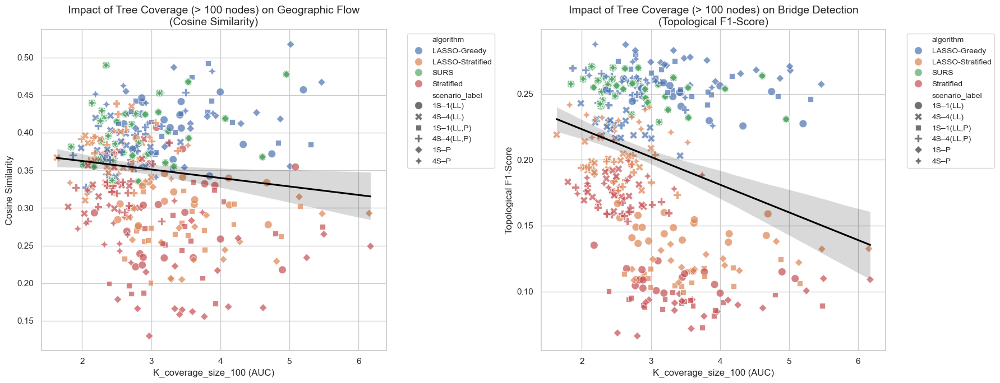

--- Within-Group Correlation & R² (Simpson's Paradox Check) ---
Note: 'r' is Pearson correlation (-1 to 1). 'R²' is variance explained (0 to 1).
If global line is negative, but 'r' here is positive, Simpson's Paradox is occurring!

K_coverage_size_100 Table


,Algorithm,Scenario,r (Cosine),R² (Cosine),r (F1),R² (F1)
0,LASSO-Greedy,1S–1(LL),0.144,0.021,-0.617,0.380
1,LASSO-Greedy,"1S–1(LL,P)",-0.029,0.001,-0.669,0.448
2,LASSO-Greedy,1S–P,0.217,0.047,-0.669,0.448
3,LASSO-Greedy,4S–4(LL),-0.223,0.050,-0.693,0.481
4,LASSO-Greedy,"4S–4(LL,P)",0.713,0.508,-0.435,0.189
5,LASSO-Greedy,4S–P,0.324,0.105,-0.711,0.505
6,LASSO-Stratified,1S–1(LL),0.016,0.000,-0.162,0.026
7,LASSO-Stratified,"1S–1(LL,P)",0.315,0.099,0.163,0.027
8,LASSO-Stratified,1S–P,0.237,0.056,0.460,0.212
9,LASSO-Stratified,4S–4(LL),0.027,0.001,-0.350,0.123





ANALYSIS: Tree Coverage (> 1000 nodes)
Saved plot to: Scatter_L_coverage_size_1000_vs_Mugration.png


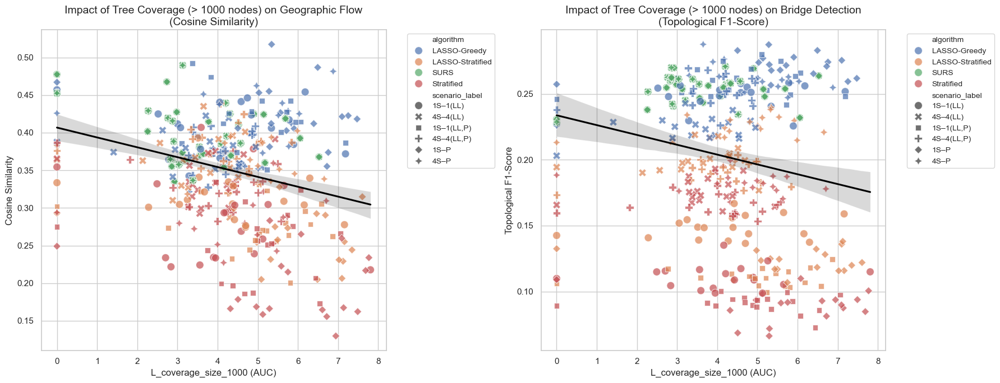

--- Within-Group Correlation & R² (Simpson's Paradox Check) ---
Note: 'r' is Pearson correlation (-1 to 1). 'R²' is variance explained (0 to 1).
If global line is negative, but 'r' here is positive, Simpson's Paradox is occurring!

L_coverage_size_1000 Table


,Algorithm,Scenario,r (Cosine),R² (Cosine),r (F1),R² (F1)
0,LASSO-Greedy,1S–1(LL),-0.115,0.013,0.251,0.063
1,LASSO-Greedy,"1S–1(LL,P)",0.034,0.001,0.176,0.031
2,LASSO-Greedy,1S–P,-0.278,0.077,0.163,0.026
3,LASSO-Greedy,4S–4(LL),0.008,0.000,0.343,0.118
4,LASSO-Greedy,"4S–4(LL,P)",-0.403,0.162,0.216,0.047
5,LASSO-Greedy,4S–P,0.199,0.040,0.238,0.057
6,LASSO-Stratified,1S–1(LL),-0.272,0.074,0.209,0.044
7,LASSO-Stratified,"1S–1(LL,P)",-0.212,0.045,0.109,0.012
8,LASSO-Stratified,1S–P,-0.249,0.062,-0.074,0.005
9,LASSO-Stratified,4S–4(LL),0.103,0.011,0.108,0.012





ANALYSIS: 8-Week Rolling Tree Coverage
Saved plot to: Scatter_M_8_week_rolling_tree_coverage_vs_Mugration.png


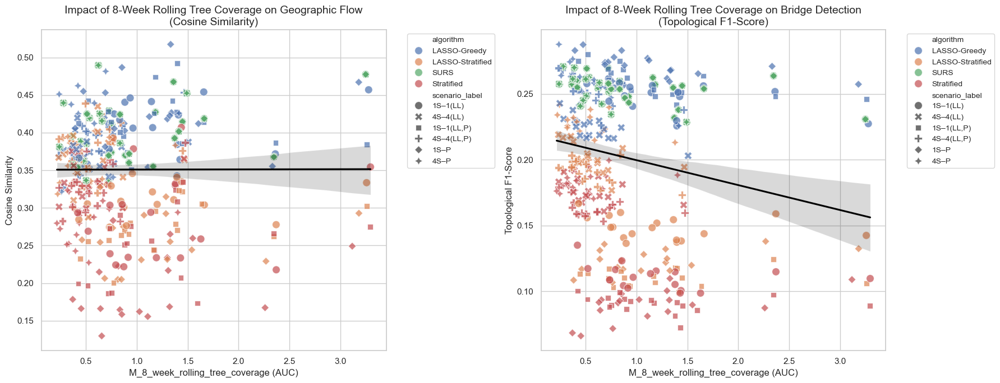

--- Within-Group Correlation & R² (Simpson's Paradox Check) ---
Note: 'r' is Pearson correlation (-1 to 1). 'R²' is variance explained (0 to 1).
If global line is negative, but 'r' here is positive, Simpson's Paradox is occurring!

M_8_week_rolling_tree_coverage Table


,Algorithm,Scenario,r (Cosine),R² (Cosine),r (F1),R² (F1)
0,LASSO-Greedy,1S–1(LL),0.248,0.062,-0.510,0.260
1,LASSO-Greedy,"1S–1(LL,P)",-0.107,0.011,-0.665,0.442
2,LASSO-Greedy,1S–P,0.079,0.006,-0.595,0.354
3,LASSO-Greedy,4S–4(LL),-0.045,0.002,-0.776,0.602
4,LASSO-Greedy,"4S–4(LL,P)",0.776,0.602,-0.532,0.283
5,LASSO-Greedy,4S–P,0.197,0.039,-0.848,0.719
6,LASSO-Stratified,1S–1(LL),0.065,0.004,-0.271,0.073
7,LASSO-Stratified,"1S–1(LL,P)",0.481,0.231,0.029,0.001
8,LASSO-Stratified,1S–P,0.056,0.003,0.476,0.226
9,LASSO-Stratified,4S–4(LL),0.074,0.006,-0.485,0.235





--- Summary for X: K_coverage_size_100 | Y: cosine_similarity ---
,X_Cov,X_Cov,X_Cov,X_Cov,X_Cov,X_Cov,X_Cov,X_Cov,X_Cov,X_Cov,X_Cov,X_Cov,X_Cov,X_Cov,X_Cov,X_Cov,X_Cov,X_Cov,X_Cov,X_Cov,X_Cov,X_Cov,X_Cov,X_Cov,X_Cov,X_Cov,X_Cov,X_Cov,X_Cov,X_Cov,Y_Cos,Y_Cos,Y_Cos,Y_Cos,Y_Cos,Y_Cos,Y_Cos,Y_Cos,Y_Cos,Y_Cos,Y_Cos,Y_Cos,Y_Cos,Y_Cos,Y_Cos,Y_Cos,Y_Cos,Y_Cos,Y_Cos,Y_Cos,Y_Cos,Y_Cos,Y_Cos,Y_Cos,Y_Cos,Y_Cos,Y_Cos,Y_Cos,Y_Cos,Y_Cos
,min,min,min,min,min,min,25%,25%,25%,25%,25%,25%,med,med,med,med,med,med,75%,75%,75%,75%,75%,75%,max,max,max,max,max,max,min,min,min,min,min,min,25%,25%,25%,25%,25%,25%,med,med,med,med,med,med,75%,75%,75%,75%,75%,75%,max,max,max,max,max,max
scenario_label,1S–1(LL),"1S–1(LL,P)",1S–P,4S–4(LL),"4S–4(LL,P)",4S–P,1S–1(LL),"1S–1(LL,P)",1S–P,4S–4(LL),"4S–4(LL,P)",4S–P,1S–1(LL),"1S–1(LL,P)",1S–P,4S–4(LL),"4S–4(LL,P)",4S–P,1S–1(LL),"1S–1(LL,P)",1S–P,4S–4(LL),"4S–4(LL,P)",4S–P,1S–1(LL),"1S–1(LL,P)",1S–P,4S–4(LL),"4S–4(LL,P)",4S–P,1S–1(LL),"1S–1(LL,P)",1S–P,4S–4(LL),"4S–4(LL

/var/folders/pq/2t2l79812g3fsrtcvgbf15580000gq/T/ipykernel_82395/779938364.py:21: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  dist_df = df_subset.groupby(['algorithm', 'scenario_label']).apply(


In [44]:
df_merged, df_graph_pivot = get_data(Path("./lasso_greedy50"))
graph_mugration_heat(df_graph_pivot, df_merged, graph_prefixes=('F_', 'I_', 'J_', 'K_', 'L_', 'M_'))
graph_mugration_scatter(df_merged)
print_metric_ranges(df_merged, x_metric='K_coverage_size_100', y_metric='cosine_similarity')


## SINGLE REPLICATE CHECK
1. out-degree + over-undersampling of demographics,
2. transmission-chains + counties sampled
3. samples involved in cross-county transmission

Loading true infection data and building graph...
Loading SURS and LASSO-Greedy samples...

--- Mean Secondary Infections (Out-Degree) of Sampled Nodes ---
Algorithm
LASSO-Greedy    1.456875
SURS            1.483125
Name: true_out_degree, dtype: float64

--- Over/Under Sampling by Demographic (LASSO vs SURS) ---


Algorithm                     LASSO-Greedy  SURS  Difference (LASSO - SURS)
age_group           smh_race                                               
Older adult (50-64) White              446   307                        139
Adult (18-49)       White              738   602                        136
                    Latino             113    74                         39
Senior (65+)        White              172   134                         38
                    Black               38    17                         21
Adult (18-49)       Asian               84    73                         11
Preschool (0-4)     Black               23    13                         10
Adult (18-49)       Black              154   146                          8
Preschool (0-4)     White               75    68                          7
Older adult (50-64) Latino              29    25                          4
Preschool (0-4)     Other               15    12                          3
Adult (18-49)       Other               31    29                          2
Senior (65+)        Other                3     2                          1
Older adult (50-64) Other                5     6                         -1
Senior (65+)        Latino               4     7                         -3
Preschool (0-4)     Latino              10    15                         -5
                    Asian                9    14                         -5
Older adult (50-64) Black               73    78                         -5
                    Asian               21    27                         -6
Senior (65+)        Asian                8    19                        -11
Student (5-17)      Asian               65   117                        -52
                    Other               55   109                        -54
                    Latino             103   179                        -76
                    White              794   881                        -87
                    Black              132   246                       -114

/var/folders/pq/2t2l79812g3fsrtcvgbf15580000gq/T/ipykernel_82395/1288348478.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=combined_samples, x='Algorithm', y='true_out_degree', showfliers=False, palette='Set2')


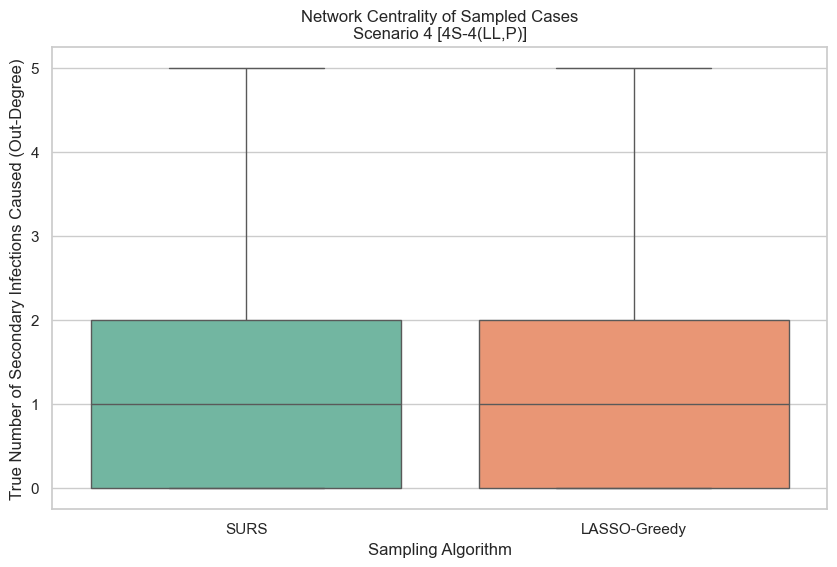


Number of 'Super-Spreaders' (Out-degree >= 5) captured:
SURS: 186
LASSO-Greedy: 177


'How to Interpret the Output\n\n1.  Mean Out-Degree & Boxplot: If LASSO-Greedy has a higher average out-degree,\n    you have definitively proven that its bias-correction mechanism\n    mathematically funnels it toward highly connected transmission hubs.\n2.  The Demographic Table: Look at the Difference column.\n      - Positive numbers: Demographics that LASSO-Greedy aggressively up-sampled\n        to fix the bias.\n      - Negative numbers: Demographics that SURS wasted its budget on (the\n        highly-ascertained "clumps").\n3.  The "Aha!" Moment: Look at the demographics that LASSO-Greedy up-sampled\n    (e.g., "Low SES Hispanic Adults"). Go back to your inf_df (the ground\n    truth). Do those specific demographics naturally have a higher out-degree in\n    the epidemic model?\n\nHow this informs your Reinforcement Learning design\n\nIf the analysis shows that LASSO-Greedy succeeded because it shifted budget away\nfrom highly-ascertained dead-ends (like elderly populations in 

In [48]:
'''
This is exactly the right analytical mindset. Before you design a Contextual
Multi-Armed Bandit (CMAB), you need to know what the "context" actually looks
like. If you blindly set the bandit to hunt for graph coverage, it might thrash
around uselessly. You need to know what demographic features it should be paying
attention to.

To understand why LASSO-Greedy 50 accidentally achieved the "Holy Grail" (high
coverage and high flow accuracy without explicitly optimizing for them), we need
to reverse-engineer its behavior.

Since you already have the saved _samples.csv.xz files and the true infection
graph, you can explore this right now, without re-running the simulations.

We need to answer two questions:

1.  Who did LASSO-Greedy actually pick? (Compared to SURS).
2.  What was their structural role in the epidemic? (Did LASSO accidentally pick
    the super-spreaders and bridge nodes?)

Here is the strategy and the exact Jupyter Notebook code to unpack the "black
box."

The Theory: The "Macro-Bucket" Homophily Hypothesis

With 1500 subgroups, LASSO was forced to pick exactly 1
"Rural-Asian-Senior-Male." This broke transmission chains. With 50 subgroups,
LASSO created "Macro-Buckets" (e.g., combining all Low-SES Rural Adults into one
group). When it needed to sample from that Macro-Bucket, it was free to follow
the natural density of the virus within that broad demographic. Because it had
flexibility, it naturally fell into sampling the "thickest" parts of the
localized transmission chains (homophily), maximizing both coverage and flow
proportions.

How to Prove It (The Notebook Code)

We can calculate the Out-Degree (Number of secondary infections) for every
person sampled by LASSO-Greedy vs. SURS. If LASSO-Greedy 50 consistently
selected individuals with higher out-degrees, it proves that "Macro-Bucketing"
allows the greedy algorithm to naturally gravitate toward the structurally
important nodes.

Add this cell to your Jupyter Notebook. It will analyze your existing outputs to
tell you exactly which demographics resulted in high graph connectivity.
'''

import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# ==========================================
# 1. Configuration & Data Loading
# ==========================================
# Use one of your replicate folders for deep-dive analysis
rep_dir = Path("./lasso_greedy50/replicate_0")
# We want to compare the 4S-4(LL,P) scenario where Greedy50 did so well
scenario_id = 4 

print("Loading true infection data and building graph...")
inf_file = rep_dir / "linelist_allevents.csv.xz"
inf_df = pd.read_csv(inf_file, dtype={'alias_pid': str, 'alias_contact': str})

# Build the true directed transmission graph
G_dir = nx.DiGraph()
edges = [(str(row.alias_contact), str(row.alias_pid)) for row in inf_df.itertuples() 
         if str(row.alias_contact) not in ["-1", "nan"]]
G_dir.add_edges_from(edges)

# Calculate Out-Degree (Secondary Infections) for every node in the simulation
out_degrees = dict(G_dir.out_degree())
inf_df['true_out_degree'] = inf_df['alias_pid'].map(out_degrees).fillna(0)

# ==========================================
# 2. Load the Samples
# ==========================================
print("Loading SURS and LASSO-Greedy samples...")
# Find the specific sample files
surs_file = list(rep_dir.glob(f"*_scenario{scenario_id}_SURS_samples.csv.xz"))[0]
lasso_file = list(rep_dir.glob(f"*_scenario{scenario_id}_LASSO-Greedy_samples.csv.xz"))[0]

surs_df = pd.read_csv(surs_file, dtype={'alias_pid': str})
lasso_df = pd.read_csv(lasso_file, dtype={'alias_pid': str})

# Attach the true graph properties to the samples
surs_df['true_out_degree'] = surs_df['alias_pid'].map(out_degrees).fillna(0)
lasso_df['true_out_degree'] = lasso_df['alias_pid'].map(out_degrees).fillna(0)

surs_df['Algorithm'] = 'SURS'
lasso_df['Algorithm'] = 'LASSO-Greedy'

combined_samples = pd.concat([surs_df, lasso_df], ignore_index=True)

# ==========================================
# 3. Analyze the Differences
# ==========================================
print("\n--- Mean Secondary Infections (Out-Degree) of Sampled Nodes ---")
print(combined_samples.groupby('Algorithm')['true_out_degree'].mean())

# 4. WHICH Demographics are driving the difference?
# Let's group by Age and Race to see who LASSO is picking that SURS is missing
print("\n--- Over/Under Sampling by Demographic (LASSO vs SURS) ---")
demo_counts = combined_samples.groupby(['Algorithm', 'age_group', 'smh_race']).size().unstack(level=0).fillna(0)
demo_counts['Difference (LASSO - SURS)'] = demo_counts['LASSO-Greedy'] - demo_counts['SURS']

# Sort to see the biggest shifts
demo_counts = demo_counts.sort_values('Difference (LASSO - SURS)', ascending=False)
display(demo_counts)

# ==========================================
# 5. Visualize the Topology of the Samples
# ==========================================
plt.figure(figsize=(10, 6))
sns.boxplot(data=combined_samples, x='Algorithm', y='true_out_degree', showfliers=False, palette='Set2')
plt.title(f"Network Centrality of Sampled Cases\nScenario {scenario_id} [4S-4(LL,P)]")
plt.ylabel("True Number of Secondary Infections Caused (Out-Degree)")
plt.xlabel("Sampling Algorithm")
plt.show()

# Let's look at the "Whales" (Super-spreaders)
surs_whales = (surs_df['true_out_degree'] >= 5).sum()
lasso_whales = (lasso_df['true_out_degree'] >= 5).sum()
print(f"\nNumber of 'Super-Spreaders' (Out-degree >= 5) captured:")
print(f"SURS: {surs_whales}")
print(f"LASSO-Greedy: {lasso_whales}")

'''How to Interpret the Output

1.  Mean Out-Degree & Boxplot: If LASSO-Greedy has a higher average out-degree,
    you have definitively proven that its bias-correction mechanism
    mathematically funnels it toward highly connected transmission hubs.
2.  The Demographic Table: Look at the Difference column.
      - Positive numbers: Demographics that LASSO-Greedy aggressively up-sampled
        to fix the bias.
      - Negative numbers: Demographics that SURS wasted its budget on (the
        highly-ascertained "clumps").
3.  The "Aha!" Moment: Look at the demographics that LASSO-Greedy up-sampled
    (e.g., "Low SES Hispanic Adults"). Go back to your inf_df (the ground
    truth). Do those specific demographics naturally have a higher out-degree in
    the epidemic model?

How this informs your Reinforcement Learning design

If the analysis shows that LASSO-Greedy succeeded because it shifted budget away
from highly-ascertained dead-ends (like elderly populations in nursing homes who
get tested often but infect few others) and toward under-ascertained bridge
nodes (like young adults who don't get tested but infect many), you have found
your context for the Multi-Armed Bandit!

When you build the CMAB, your "Context" (X variables) should explicitly be the
Age, Race, County, and SES. Your "Reward" will be the graph coverage. The MAB
will quickly learn the exact coefficients you just discovered in this analysis,
actively hunting for the demographics that act as the structural bridges of the
pandemic.
'''

In [49]:
# 1. Map every sampled person to their True Component ID from the full infection graph
# (You might already have 'component_id' in your sample dfs, but let's be mathematically certain by using the ground truth)
G_undirected = G_dir.to_undirected()
components = list(nx.connected_components(G_undirected))

node_to_comp = {}
for i, comp in enumerate(components):
    for node in comp:
        node_to_comp[node] = i

combined_samples['true_component_id'] = combined_samples['alias_pid'].map(node_to_comp)

# 2. Count the Unique Components Captured
print("\n--- Unique Transmission Chains (Components) Captured ---")
print(combined_samples.groupby('Algorithm')['true_component_id'].nunique())

# 3. Measure Geographic Spread (Counties Hit)
print("\n--- Unique Counties Sampled ---")
print(combined_samples.groupby('Algorithm')['county'].nunique())


--- Unique Transmission Chains (Components) Captured ---
Algorithm
LASSO-Greedy    56
SURS            54
Name: true_component_id, dtype: int64

--- Unique Counties Sampled ---
Algorithm
LASSO-Greedy    127
SURS            128
Name: county, dtype: int64


In [50]:
# 1. Build county lookup directly from the infections dataframe
# inf_df (linelist_allevents.csv.xz) already has 'alias_pid' and 'county'
print("Mapping counties from infection events...")
alias_to_county = dict(zip(inf_df['alias_pid'].astype(str), inf_df['county']))

# 2. Build the list of cross-county transmission edges
print("Identifying geographic boundary nodes...")
cross_county_edges = []
for u, v in G_dir.edges():
    u_county = alias_to_county.get(u)
    v_county = alias_to_county.get(v)
    
    # Check if both have known counties and they differ
    if u_county and v_county and (u_county != v_county):
        cross_county_edges.append((u, v))

# A "boundary node" is anyone on either side of a county-jumping transmission
cross_county_nodes = set([n for edge in cross_county_edges for n in edge])
print(f"Found {len(cross_county_edges)} inter-county transmission events involving {len(cross_county_nodes)} unique people.")

# 3. Check our samples against the cross-county nodes
surs_boundary_nodes = surs_df['alias_pid'].isin(cross_county_nodes).sum()
lasso_boundary_nodes = lasso_df['alias_pid'].isin(cross_county_nodes).sum()

print("\n--- Proportion of Samples involved in Cross-County Transmission ---")
print(f"SURS:         {surs_boundary_nodes} / {len(surs_df)} ({(surs_boundary_nodes/len(surs_df))*100:.1f}%)")
print(f"LASSO-Greedy: {lasso_boundary_nodes} / {len(lasso_df)} ({(lasso_boundary_nodes/len(lasso_df))*100:.1f}%)")

Mapping counties from infection events...
Identifying geographic boundary nodes...
Found 913741 inter-county transmission events involving 1308350 unique people.

--- Proportion of Samples involved in Cross-County Transmission ---
SURS:         910 / 3200 (28.4%)
LASSO-Greedy: 1076 / 3200 (33.6%)


In [ ]:
# =============================================================================
# SCENARIO ID MAPPING & EXPLANATIONS
#
# Naming Convention Syntax: [Stride]S-[Window]([Target])
# -----------------------------------------------------------------------------
# 1. Stride ("1S" or "4S"): 
#    How often the sampling algorithm runs (Every 1 week vs. Every 4 weeks).
# 2. Window ("1" or "4" or omitted): 
#    The historical data pool it looks at (e.g., a 4-week rolling window).
# 3. Target ("LL", "P", or "LL,P"): 
#    The objective distribution the algorithm is trying to match:
#      - (LL)   = Line List: Matches the biased pool of observed cases.
#      - (P)    = Population: Matches the static census demographics (bias correction).
#      - (LL,P) = Blended: A 50/50 hybrid target of Line List and Population.
#
# ID Mapping:
# -----------------------------------------------------------------------------
# 1: "1S–1(LL)"   -> Samples every week. Targets the Line List distribution.
# 
# 2: "4S–4(LL)"   -> Samples every 4 weeks using a 4-week rolling pool. 
#                    Targets the Line List distribution.
#
# 3: "1S–1(LL,P)" -> Samples every week. Targets the Blended distribution 
#                    (balancing epidemic reality with demographic equity).
#
# 4: "4S–4(LL,P)" -> Samples every 4 weeks using a 4-week rolling pool. 
#                    Targets the Blended distribution. (The "Sweet Spot" scenario).
#
# 5: "1S–P"       -> Samples every week. Targets the strict Census Population.
#                    (Aggressive demographic bias correction).
#
# 6: "4S–P"       -> Samples every 4 weeks using a 4-week rolling pool. 
#                    Targets the strict Census Population.
# =============================================================================

SCEN_LABELS = {
    1: "1S-1(LL)", 
    2: "4S-4(LL)", 
    3: "1S-1(LL,P)",
    4: "4S-4(LL,P)", 
    5: "1S-P", 
    6: "4S-P",
}

## REPLICATE CHECKS
1. out-degree + over-undersampling of demographics,
2. transmission-chains + counties sampled
3. samples involved in cross-county transmission

In [ ]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# ==========================================
# 1. Configuration & Paths
# ==========================================
# Folder containing the Ground Truth (linelist_allevents.csv.xz)
LINELIST_ROOT = Path("/project/bii_nssac/biocomplexity/c4gc_asw3xp/LineList/asw_test/twin_sampler/scripts/linelist_generation/results")

# Folder containing the Algorithm Samples (e.g., SURS_samples.csv.xz)
# Make sure this points to the specific batch size folder you want to analyze!
SAMPLES_ROOT = Path("/project/bii_nssac/biocomperty/c4gc_asw3xp/LineList/asw_test/twin_sampler/scripts/scenarios_simulation/scenario_runs/size_sweep/batch_400")

SCENARIO_ID = 4 # E.g., 4S-4(LL,P)

# ==========================================
# 2. Analysis Functions (Called per replicate)
# ==========================================

def get_outdegree_and_demographics(combined_samples):
    """Check 1: Out-degree stats and demographic counts."""
    # Out-degree
    out_degree_df = combined_samples[['replicate', 'Algorithm', 'true_out_degree']].copy()
    
    # Demographics
    demo_counts = combined_samples.groupby(['Algorithm', 'age_group', 'smh_race']).size().unstack(level=0).fillna(0)
    if 'LASSO-Greedy' in demo_counts and 'SURS' in demo_counts:
        demo_counts['Diff'] = demo_counts['LASSO-Greedy'] - demo_counts['SURS']
    else:
        demo_counts['Diff'] = 0.0
    
    return out_degree_df, demo_counts[['Diff']]

def get_component_county_coverage(combined_samples):
    """Check 2: Unique transmission chains and counties sampled."""
    stats = combined_samples.groupby('Algorithm').agg(
        unique_components=('true_component_id', 'nunique'),
        unique_counties=('county', 'nunique')
    ).reset_index()
    return stats

def get_boundary_nodes(surs_df, lasso_df, cross_county_nodes):
    """Check 3: Proportion of samples involved in cross-county transmission."""
    s_bound = surs_df['alias_pid'].isin(cross_county_nodes).sum()
    l_bound = lasso_df['alias_pid'].isin(cross_county_nodes).sum()
    
    return pd.DataFrame([
        {'Algorithm': 'SURS', 'boundary_count': s_bound, 'total': len(surs_df)},
        {'Algorithm': 'LASSO-Greedy', 'boundary_count': l_bound, 'total': len(lasso_df)}
    ])

# ==========================================
# 3. Main Loop Over Replicates
# ==========================================
all_out_degrees = []
all_demo_diffs = []
all_comp_cov = []
all_boundary = []

replicate_folders = sorted([d for d in LINELIST_ROOT.glob("replicate_*") if d.is_dir()])

print(f"Starting analysis over {len(replicate_folders)} replicates...")

for rep_dir in replicate_folders:
    rep_name = rep_dir.name
    sample_rep_dir = SAMPLES_ROOT / rep_name
    
    inf_file = rep_dir / "linelist_allevents.csv.xz"
    surs_file = list(sample_rep_dir.glob(f"*_scenario{SCENARIO_ID}_SURS_samples.csv.xz"))
    lasso_file = list(sample_rep_dir.glob(f"*_scenario{SCENARIO_ID}_LASSO-Greedy_samples.csv.xz"))
    
    if not (inf_file.exists() and surs_file and lasso_file):
        continue # Skip if missing files
        
    # --- A. Build Ground Truth for this Replicate ---
    inf_df = pd.read_csv(inf_file, dtype={'alias_pid': str, 'alias_contact': str})
    
    G_dir = nx.DiGraph()
    edges = [(str(row.alias_contact), str(row.alias_pid)) for row in inf_df.itertuples() if str(row.alias_contact) not in ["-1", "nan"]]
    G_dir.add_edges_from(edges)
    
    out_degrees = dict(G_dir.out_degree())
    
    G_undirected = G_dir.to_undirected()
    components = list(nx.connected_components(G_undirected))
    node_to_comp = {node: i for i, comp in enumerate(components) for node in comp}
    
    alias_to_county = dict(zip(inf_df['alias_pid'].astype(str), inf_df['county']))
    cross_county_edges = [(u, v) for u, v in G_dir.edges() if alias_to_county.get(u) and alias_to_county.get(v) and alias_to_county.get(u) != alias_to_county.get(v)]
    cross_county_nodes = set([n for edge in cross_county_edges for n in edge])
    
    # --- B. Load Samples ---
    surs_df = pd.read_csv(surs_file[0], dtype={'alias_pid': str})
    lasso_df = pd.read_csv(lasso_file[0], dtype={'alias_pid': str})
    
    surs_df['Algorithm'] = 'SURS'
    lasso_df['Algorithm'] = 'LASSO-Greedy'
    
    combined = pd.concat([surs_df, lasso_df], ignore_index=True)
    combined['replicate'] = rep_name
    combined['true_out_degree'] = combined['alias_pid'].map(out_degrees).fillna(0)
    combined['true_component_id'] = combined['alias_pid'].map(node_to_comp)

    # --- C. Run Checks & Collect ---
    out_df, demo_df = get_outdegree_and_demographics(combined)
    demo_df['replicate'] = rep_name
    
    comp_df = get_component_county_coverage(combined)
    comp_df['replicate'] = rep_name
    
    bound_df = get_boundary_nodes(surs_df, lasso_df, cross_county_nodes)
    bound_df['replicate'] = rep_name
    
    all_out_degrees.append(out_df)
    all_demo_diffs.append(demo_df.reset_index())
    all_comp_cov.append(comp_df)
    all_boundary.append(bound_df)

print("Data collection complete. Aggregating results...")

# ==========================================
# 4. Aggregation and Visualization
# ==========================================
# Pool the data
df_outdegree = pd.concat(all_out_degrees, ignore_index=True)
df_demo = pd.concat(all_demo_diffs, ignore_index=True)
df_comp = pd.concat(all_comp_cov, ignore_index=True)
df_bound = pd.concat(all_boundary, ignore_index=True)

# 1. Output Demographics Table (Mean difference across replicates)
mean_demo_diff = df_demo.groupby(['age_group', 'smh_race'])['Diff'].mean().reset_index()
mean_demo_diff = mean_demo_diff.sort_values('Diff', ascending=False)
print("\n--- Mean Over/Under Sampling (LASSO - SURS) per Replicate ---")
print(mean_demo_diff.head(10).to_string(index=False))
print("...")
print(mean_demo_diff.tail(5).to_string(index=False))

# 2. Output Components / Counties (Median across replicates)
agg_comp = df_comp.groupby('Algorithm').agg({
    'unique_components': 'median',
    'unique_counties': 'median'
}).reset_index()
print("\n--- Median Unique Components and Counties Captured ---")
print(agg_comp.to_string(index=False))

# 3. Output Boundary Nodes (Mean percentage across replicates)
df_bound['pct_boundary'] = (df_bound['boundary_count'] / df_bound['total']) * 100
agg_bound = df_bound.groupby('Algorithm')['pct_boundary'].mean().reset_index()
print("\n--- Mean Percentage of Samples as Geographic Boundary Nodes ---")
print(agg_bound.to_string(index=False))

# 4. Pooled Boxplot for Out-Degree
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_outdegree, x='Algorithm', y='true_out_degree', showfliers=False, palette='Set2')
plt.title(f"Network Centrality of Sampled Cases\nPooled across {len(replicate_folders)} Replicates (Scenario {SCENARIO_ID})")
plt.ylabel("True Secondary Infections Caused (Out-Degree)")
plt.xlabel("Sampling Algorithm")
plt.tight_layout()
plt.show()